<a href="https://colab.research.google.com/github/EmanuelAlogna/MRI-generation/blob/master/results/pix2pix_(P2P_t1_from_t1c).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Import libraries and mount the drive

In [1]:
try:
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import os
from IPython import display
import time
import math

print(tf.__version__)

from google.colab import drive
drive.mount('/content/drive')

TensorFlow 2.x selected.
2.1.0-rc1
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading train, validation and test sets

In [0]:
def get_feature_description(modalities):                                                   
                                                                                           
    feature_description =lambda mod : {                                                    
                            mod+'_mri': tf.io.FixedLenFeature([], tf.string),              
                            mod+'_path': tf.io.FixedLenFeature([], tf.string),             
                                                                                           
                            mod+'_mri_min': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_min_src': tf.io.FixedLenFeature([], tf.float32),     
                            mod+'_mri_max': tf.io.FixedLenFeature([], tf.float32),         
                            mod+'_mri_max_src': tf.io.FixedLenFeature([], tf.float32),     
                                                                                           
                            mod+'_mri_lperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc': tf.io.FixedLenFeature([], tf.float32),       
                            mod+'_mri_hperc_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_mri_lperc_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_x_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_y_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension': tf.io.FixedLenFeature([], tf.int64),       
                            mod+'_z_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_x_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                            mod+'_y_dimension_src': tf.io.FixedLenFeature([], tf.int64),   
                                                                                           
                            mod+'_x_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_y_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                            mod+'_z_origin_src': tf.io.FixedLenFeature([], tf.float32),    
                                                                                           
                            mod+'_z_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_x_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                            mod+'_y_spacing_src': tf.io.FixedLenFeature([], tf.float32),   
                                                                                           
                            mod+'_patient': tf.io.FixedLenFeature([], tf.string),          
                            mod+'_sample_number': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_grade': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_location': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_version': tf.io.FixedLenFeature([], tf.string),  
                            mod+'_dataset_name': tf.io.FixedLenFeature([], tf.string),     
                            mod+'_mri_type': tf.io.FixedLenFeature([], tf.string),         
                            mod+'_dataset_split': tf.io.FixedLenFeature([], tf.string),    
                            mod+'_patient_mri_seq': tf.io.FixedLenFeature([], tf.string),  
                          }                                                                
    features = {}                                                                          
    for mod in modalities:
        features.update(feature_description(mod))
    return features

In [0]:
#BUFFER_SIZE = 400
BATCH_SIZE = 32

In [0]:
use_gzip_compression = True

def load_dataset(name, mri_type, center_crop=None, random_crop=None, filter=None, batch_size=BATCH_SIZE, cache=True, 
                 prefetch_buffer=1, shuffle_buffer=128, interleave=1, cast_to=tf.float32, clip_labels_to=0.0, 
                 take_only=None, shuffle=True, infinite=False, n_threads=os.cpu_count()):
    def parse_sample(sample_proto):
        parsed = tf.io.parse_single_example(sample_proto, get_feature_description(["OT"]+mri_type))
        # Decoding image arrays
        
        slice_shape = [parsed['OT_x_dimension'.format(mri_type[0])], parsed['OT_y_dimension'], 1]
        # Decoding the ground truth
        parsed['seg'] = tf.cast(tf.reshape(tf.io.decode_raw(parsed['OT_mri'], tf.float32), shape=slice_shape), dtype=cast_to)
        # Decode each channel and stack in a 3d volume
        stacked_mri = list()
        for mod in mri_type:
            stacked_mri.append(tf.cast(tf.reshape(tf.io.decode_raw(parsed['{}_mri'.format(mod)], tf.float32), shape=slice_shape), dtype=cast_to))
        parsed['mri'] = tf.concat(stacked_mri, axis=-1)
        # Clipping the labels if requested
        parsed['seg'] = tf.clip_by_value(parsed['seg'], 0.0, clip_labels_to) if clip_labels_to else parsed['seg']
        
        # Cropping
        if random_crop or center_crop:
            # Stacking the mri and the label to align the crop shape
            mri_seg = tf.concat([parsed['mri'], parsed['seg']], axis=-1)
            if random_crop:
                random_crop[-1] = mri_seg.shape[-1] 
                cropped = tf.image.random_crop(mri_seg, size=random_crop)
            else:
                cropped = tf.image.resize_with_crop_or_pad(mri_seg,center_crop[0],center_crop[1])
            # Splitting back
            parsed['mri'] = cropped[:,:,:len(mri_type)]
            parsed['seg'] = cropped[:,:,len(mri_type):]
        
        return parsed
    
    path = './drive/My Drive/MRI-generation/{}.tfrecords'.format(name)
    dataset = tf.data.TFRecordDataset(path, compression_type='GZIP' if use_gzip_compression else "")
    dataset = dataset.filter(filter) if filter is not None else dataset
    dataset = dataset.take(take_only) if take_only is not None else dataset

    # You should generally cache after loading and preprocessing the data, 
    # but before shuffling, repeating, batching and prefetching”
    dataset = dataset.cache() if cache else dataset
    if shuffle and infinite:
        dataset = dataset.apply(tf.data.experimental.shuffle_and_repeat(shuffle_buffer))
    else:
        dataset = dataset.shuffle(shuffle_buffer, reshuffle_each_iteration=True) if shuffle else dataset
        dataset = dataset.repeat() if infinite else dataset
    dataset = dataset.map(parse_sample, num_parallel_calls=None)
    dataset = dataset.batch(batch_size) if batch_size > 0 else dataset
    

    if interleave > 1:
        dataset = dataset.interleave(lambda x: tf.data.Dataset.from_tensors(x).repeat(interleave), cycle_length=n_threads, block_length=interleave, num_parallel_calls=n_threads)
  
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

In [0]:
# loading all the dataset, with only modality T1 and T2
# I'll focus now on synthesizing T2 from T1

def load_datasets():
    validation = load_dataset('brats2015_validation_crop_mri', ['MR_T1', 'MR_T1c'], shuffle=False)
    training = load_dataset('brats2015_training_crop_mri', ['MR_T1', 'MR_T1c'], shuffle=True)
    testing = load_dataset('brats2015_testing_crop_mri', ['MR_T1', 'MR_T1c'], shuffle=True)
    return training, validation , testing

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

modalities = ['MR_T1c_mri', 'MR_T1_mri', 'OT_mri']

## Load some useful functions


In [0]:
# PROCESSING IMAGES IN THE BATCH
def process_batch(batch):   # takes in input a raw_record[mod].numpy()
    batch = tf.io.decode_raw(batch, tf.float32)
    batch = tf.reshape(batch, (BATCH_SIZE, 180, 180))
    paddings = tf.constant([[0, 0], [38, 38], [38, 38]])
    batch = tf.pad(batch, paddings, "CONSTANT")
    batch = tf.expand_dims(batch, axis=3)
    return batch
    
# final shape will be (bs, 256, 256, 1): now the batch is ready to be fed to the GAN

In [0]:
# this function preprocesses the input image and the ground truth from a raw_record
# images in the return are then ready to be fed into the GAN
def take_images_from_raw(raw_record, ot=False):

    inp, ground_truth = raw_record[modalities[0]], raw_record[modalities[1]]
    inp = process_batch(inp)
    ground_truth = process_batch(ground_truth)
    if ot:      # if ot is true, I'll retrieve also the segmentation from the raw_record
        segmentation = process_batch(raw_record[modalities[2]])
        return inp, ground_truth, segmentation
    return inp, ground_truth

In [0]:
def resize_with_crop(*args): # possibile arguments: input, gt, prediction and maybe the segmentation

    image0 = tf.image.resize_with_crop_or_pad(args[0], 155, 194)
    image1 = tf.image.resize_with_crop_or_pad(args[1], 155, 194)
    image2 = tf.image.resize_with_crop_or_pad(args[2], 155, 194)
    if len(args) == 4:      # crop also the segmentation, if is given as additional argument
        image3 = tf.image.resize_with_crop_or_pad(args[3], 155, 194)
        return image0, image1, image2, image3
    return image0, image1, image2

In [0]:
def retrieve_tumor_area(ground_truth, prediction, segmentation):
    ground_truth_np = ground_truth.numpy()
    segmentation_np = segmentation.numpy()
    prediction_np = prediction.numpy()

    # I want to remove all the pixels not relevant wrt the tumor area. 
    idx = (segmentation_np==0)      
    ground_truth_np[idx] = segmentation_np[idx]
    prediction_np[idx] = segmentation_np[idx]

    return ground_truth_np, prediction_np      # Now the images are ready to be evaluated

## Evaluate GAN

In [0]:
def evaluate_GAN(model, dataset, set_type, evaluate_tumor_area=False, print_loss=False, epc=99):
    num_batches = 0                 # CAREFUL when batch_size is modified!!!
    if set_type == 'test':
        num_batches = 112           # in the test set, with batch 32, there are 112 elements.
    elif set_type == 'validation':
        num_batches = 108
    elif set_type == 'train':
        num_batches = 876
    container_psnr = tf.TensorArray(tf.float32, size=num_batches)     
    container_mse = tf.TensorArray(tf.float32, size=num_batches)
    container_ssim = tf.TensorArray(tf.float32, size=num_batches)
    
    if evaluate_tumor_area:
        container_psnr_tumor = tf.TensorArray(tf.float32, size=num_batches)     
        container_mse_tumor = tf.TensorArray(tf.float32, size=num_batches)
        container_ssim_tumor = tf.TensorArray(tf.float32, size=num_batches)
    if print_loss:
        container_gen = tf.TensorArray(tf.float32, size=num_batches)     
        container_disc = tf.TensorArray(tf.float32, size=num_batches)
    
    #idx = 0
    #for raw_record in dataset.take(10):
    for idx, raw_record in dataset.enumerate():
        inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
        # generate the prediction        
        prediction = model(inp, training=False)
        # crop the images
        inp_cr, ground_truth_cr, prediction_cr, segmentation_cr = resize_with_crop(inp, ground_truth, prediction, segmentation)
        if evaluate_tumor_area:
            ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth_cr, prediction_cr, segmentation_cr)
        if (idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83) and evaluate_tumor_area:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr, ground_truth_masked, prediction_masked)
        elif idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
            plot_images_new(inp_cr, ground_truth_cr, prediction_cr)
        
        # normalize the prediction and the ground_truth
        prediction_normalized_cr = mean_normalize(prediction_cr)
        ground_truth_normalized_cr = mean_normalize(ground_truth_cr)

        # compute the metrics of similarity
        mean, std, psnr = compute_psnr(ground_truth_normalized_cr, prediction_normalized_cr)
        container_psnr = container_psnr.write(idx, psnr)
        mean, std, mse = compute_mse(ground_truth_normalized_cr, prediction_normalized_cr)
        container_mse = container_mse.write(idx, mse)
        mean, std, ssim = compute_ssim(ground_truth_normalized_cr, prediction_normalized_cr)
        container_ssim = container_ssim.write(idx, ssim)

        if evaluate_tumor_area:
            # discard black images from pred and gt
            prediction_masked_normalized = mean_normalize(prediction_masked)
            ground_truth_masked_normalized = mean_normalize(ground_truth_masked) 
            #if (epc % 8 == 1) and idx == 0:
            #    plot_images(ground_truth_masked, prediction_masked)
            mean, std, psnr = compute_psnr(ground_truth_masked_normalized, prediction_masked_normalized)
            container_psnr_tumor = container_psnr_tumor.write(idx, psnr)
            mean, std, mse = compute_mse(ground_truth_masked_normalized, prediction_masked_normalized)
            container_mse_tumor = container_mse_tumor.write(idx, mse)
            mean, std, ssim = compute_ssim(ground_truth_masked_normalized, prediction_masked_normalized)
            container_ssim_tumor = container_ssim_tumor.write(idx, ssim)

        # COMPUTES VALIDATION LOSSES FOR THE GENERATOR AND THE DISCRIMINATOR
        if print_loss:
            disc_real_output = discriminator([inp, ground_truth], training=False)
            disc_generated_output = discriminator([inp, prediction], training=False)
            gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, ground_truth)
            disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
            container_gen = container_gen.write(idx, gen_total_loss)
            container_disc = container_disc.write(idx, disc_loss)
        #idx += 1

    container_psnr = container_psnr.stack()
    container_mse = container_mse.stack()
    container_ssim = container_ssim.stack()
    mean_psnr = tf.reduce_mean(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    std_psnr = tf.math.reduce_std(tf.boolean_mask((container_psnr), tf.math.is_finite(container_psnr)))
    mean_mse = tf.reduce_mean(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    std_mse = tf.math.reduce_std(tf.boolean_mask((container_mse), tf.math.is_finite(container_mse)))
    mean_ssim = tf.reduce_mean(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))
    std_ssim = tf.math.reduce_std(tf.boolean_mask((container_ssim), tf.math.is_finite(container_ssim)))

    print("PSNR on {} set: {} ± {}".format(set_type, (f'{mean_psnr:.4f}'), (f'{std_psnr:.4f}')))
    print("MSE on {} set: {} ± {}".format(set_type, (f'{mean_mse:.4f}'), (f'{std_mse:.4f}')))
    print("SSIM on {} set: {} ± {}".format(set_type, (f'{mean_ssim:.4f}'), (f'{std_ssim:.4f}')))

    if evaluate_tumor_area:
        container_psnr_tumor = container_psnr_tumor.stack()
        container_mse_tumor = container_mse_tumor.stack()
        container_ssim_tumor = container_ssim_tumor.stack()
        mean_psnr_tumor = tf.reduce_mean(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        std_psnr_tumor = tf.math.reduce_std(tf.boolean_mask((container_psnr_tumor), tf.math.is_finite(container_psnr_tumor)))
        mean_mse_tumor = tf.reduce_mean(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        std_mse_tumor = tf.math.reduce_std(tf.boolean_mask((container_mse_tumor), tf.math.is_finite(container_mse_tumor)))
        mean_ssim_tumor = tf.reduce_mean(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        std_ssim_tumor = tf.math.reduce_std(tf.boolean_mask((container_ssim_tumor), tf.math.is_finite(container_ssim_tumor)))
        print()
        print("PSNR wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_psnr_tumor:.4f}'), (f'{std_psnr_tumor:.4f}')))
        print("MSE wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_mse_tumor:.4f}'), (f'{std_mse_tumor:.4f}')))
        print("SSIM wrt tumor area on {} set: {} ± {}".format(set_type, (f'{mean_ssim_tumor:.4f}'), (f'{std_ssim_tumor:.4f}')))
    if print_loss:
        container_disc = container_disc.stack()
        container_gen = container_gen.stack()
        mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
        mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
        print()
        print("Generator loss on {} set: {} ± {}".format(set_type, (f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
        print("Discriminator loss on {} set: {} ± {}".format(set_type, (f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))
        
    if tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, False):
        return mean_psnr, mean_mse, mean_ssim, mean_gen, mean_disc
    elif tf.equal(print_loss, False) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor
    elif tf.equal(print_loss, True) and tf.equal(evaluate_tumor_area, True):
        return mean_psnr, mean_mse, mean_ssim, mean_psnr_tumor, mean_mse_tumor, mean_ssim_tumor, mean_gen, mean_disc
    return mean_psnr, mean_mse, mean_ssim

In [12]:
"""s = 3
container_gen = tf.TensorArray(tf.float32, size=s)
container_disc = tf.TensorArray(tf.float32, size=s)
idx = 0

generator = Generator()
discriminator = Discriminator()

for raw_record in testing.take(s):
    input_image, target = take_images_from_raw(raw_record)

    prediction = generator(input_image, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([input_image, target], training=True)
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([input_image, prediction], training=True)
    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    container_gen = container_gen.write(idx, gen_total_loss)
    container_disc = container_disc.write(idx, disc_loss)

    idx += 1
container_gen = container_gen.stack()
container_disc = container_disc.stack()

mean_gen = tf.reduce_mean(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
std_gen = tf.math.reduce_std(tf.boolean_mask((container_gen), tf.math.is_finite(container_gen)))
print("GEN loss: {} ± {}".format((f'{mean_gen:.4f}'), (f'{std_gen:.4f}')))
mean_disc = tf.reduce_mean(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
std_disc = tf.math.reduce_std(tf.boolean_mask((container_disc), tf.math.is_finite(container_disc)))
print("DISC loss: {} ± {}".format((f'{mean_disc:.4f}'), (f'{std_disc:.4f}')))

plot_loss(mean_gen, mean_disc)
"""

's = 3\ncontainer_gen = tf.TensorArray(tf.float32, size=s)\ncontainer_disc = tf.TensorArray(tf.float32, size=s)\nidx = 0\n\ngenerator = Generator()\ndiscriminator = Discriminator()\n\nfor raw_record in testing.take(s):\n    input_image, target = take_images_from_raw(raw_record)\n\n    prediction = generator(input_image, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([input_image, target], training=True)\n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([input_image, prediction], training=True)\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, target)\n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    container_gen = container_gen.write(idx, gen_total_loss)\n    container_disc = container_disc.write(idx, disc_loss)\n\n    idx += 1\ncontainer_gen = container_gen.stack()\ncontainer_disc = container_disc.stack()\n

In [0]:
def plot_loss(g_l, d_l):        
    f, (ax1) = plt.subplots(1, 1, figsize=(12, 6))
    f.subplots_adjust(hspace=0.4)
    max_epoch = g_l.shape[0]       # args[0] 
    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, g_l, label='Generator loss')
    ax1.plot(epoch_list, d_l, label='Discriminator Loss')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylim([0, 14])
    ax1.set_ylabel('Loss Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('LOSS on validation set')
    l1 = ax1.legend(loc="best")

In [0]:
def plot_metrics(*args):        # arguments will be, in order: psnr, mse, ssim, psnr_tumor*, mse_tumor*, ssim_tumor*
    tumor_area = False          # arguments with * are optional
    if len(args) == 6:
        tumor_area = True

    f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(12, 20))
    f.subplots_adjust(hspace=0.4)

    max_epoch = (args[0]).shape[0]

    epoch_list = list(range(1,max_epoch+1))
    ax1.plot(epoch_list, args[0], label='PSNR')
    if tumor_area: 
        ax1.plot(epoch_list, args[3], label='PSNR on tumor area')
    ax1.set_xticks(np.arange(1, max_epoch, 5))
    ax1.set_ylabel('PSNR Value')
    ax1.set_xlabel('Epoch')
    ax1.set_title('PSNR')
    ax1.set_ylim([9, 36])
    l1 = ax1.legend(loc="best")

    ax2.plot(epoch_list, args[1], label='MSE')
    if tumor_area: 
        ax2.plot(epoch_list, args[4], label='MSE on tumor area')
    ax2.set_xticks(np.arange(1, max_epoch, 5))
    ax2.set_ylabel('MSE Value')
    ax2.set_xlabel('Epoch')
    ax2.set_title('MSE')
    ax2.set_ylim([0.0, 0.16])
    l2 = ax2.legend(loc="best")

    ax3.plot(epoch_list, args[2], label='SSIM')
    if tumor_area: 
        ax3.plot(epoch_list, args[5], label='SSIM on tumor area')
    ax3.set_xticks(np.arange(1, max_epoch, 5))
    ax3.set_ylabel('SSIM Value')
    ax3.set_xlabel('Epoch')
    ax3.set_title('SSIM')
    ax3.set_ylim([0.0,1.0])
    l3 = ax3.legend(loc="best")


In [15]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.
"""
def plot_images(*args, images_to_print=5): 
    if images_to_print == 5: x = 15
    elif images_to_print == 32: x = 90
    if len(args) == 3:
        display_list = [args[0], args[1], args[2]]     # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (x , 9)
    elif len(args) == 2:
        display_list = [args[0], args[1]]     # input and gt
        title = ['GT in tumor area', 'Pred in tumor area']
        figsize = (x , 7)
    elif len(args) == 4:
        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked
        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 12)
    elif len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked
        title = ['Input', 'Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']
        figsize = (x , 15)
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):
        for j in range(images_to_print):    # batch size is different from 10, but let's show just 10 images.
            n += 1
            plt.subplot(len(args)+1, images_to_print, n).title.set_text(title[i])
            plt.imshow(tf.squeeze(display_list[i][j]), cmap='bone')
            plt.axis('off')
    plt.show()
    print()
    """

"\ndef plot_images(*args, images_to_print=5): \n    if images_to_print == 5: x = 15\n    elif images_to_print == 32: x = 90\n    if len(args) == 3:\n        display_list = [args[0], args[1], args[2]]     # input, gt and prediction\n        title = ['Input Image', 'Ground Truth', 'Predicted Image']\n        figsize = (x , 9)\n    elif len(args) == 2:\n        display_list = [args[0], args[1]]     # input and gt\n        title = ['GT in tumor area', 'Pred in tumor area']\n        figsize = (x , 7)\n    elif len(args) == 4:\n        display_list = [args[0], args[1], args[2], args[3]]     # gt, prediction, gt_masked, prediction_masked\n        title = ['Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tumor area']\n        figsize = (x , 12)\n    elif len(args) == 5:\n        display_list = [args[0], args[1], args[2], args[3], args[4]]     # input, gt, prediction, gt_masked, prediction_masked\n        title = ['Input', 'Ground Truth', 'Prediction', 'GT in tumor area', 'Pred in tum

In [0]:
# this method was tested to work with 5 and 32 images. Plotting 2, 3 or 4 types per time.

def plot_images_new(*args): 

    if len(args) == 5:
        display_list = [args[0], args[1], args[2], args[3], args[4]]   # input, gt, prediction, gt masked, pred masked
        title = ['Input Image', 'Ground Truth', 'Predicted Image', 'GT Tumor', 'Pred Tumor']
        figsize = (14, 7)
    elif len(args) == 3:
        display_list = [args[0], args[1], args[2]]   # input, gt and prediction
        title = ['Input Image', 'Ground Truth', 'Predicted Image']
        figsize = (8, 4)
    
    plt.figure(1 , figsize)
    n = 0
    for i in range(len(args)):    # batch size is different from 10, but let's show just 10 images.
        n += 1
        plt.subplot(1, len(args), n).title.set_text(title[i])
        plt.imshow(tf.squeeze(display_list[i][0]), cmap='bone')
        plt.axis('off')
    plt.show()

In [17]:
"""idx = 0
#for raw_record in validation.take(40):
for idx, raw_record in enumerate(validation):
    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)
    
    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)
    gen_output = generator(inp, training=False)
    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)
    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)
    
    # id = 46.. check it
    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:
        plot_images_new(inp, ground_truth, gen_output)
    idx += 1"""

'idx = 0\n#for raw_record in validation.take(40):\nfor idx, raw_record in enumerate(validation):\n    #inp, ground_truth, segmentation = take_images_from_raw(raw_record, True)\n    \n    inp, ground_truth, segmentation = take_images_from_raw(raw_record, ot=True)\n    gen_output = generator(inp, training=False)\n    inp, ground_truth, gen_output, segmentation = resize_with_crop(inp, ground_truth, gen_output, segmentation)\n    ground_truth_masked, prediction_masked = retrieve_tumor_area(ground_truth, gen_output, segmentation)\n    \n    # id = 46.. check it\n    if idx == 2 or idx == 25 or idx == 45 or idx == 50 or idx == 83:\n        plot_images_new(inp, ground_truth, gen_output)\n    idx += 1'

## Min-max normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/73032b45bffd5e5140483fbe1ed49bf174f1962d)

In [0]:
def min_max_rescale(x, xmin, xmax, a, b):
    return (a + (b-a)*(x-xmin)/(xmax-xmin))  
    # to rescale in the range [0, 1], 'a' must be 0 and 'b' = 1

In [0]:
@tf.function
def min_max_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = min_max_rescale(image[i], min_value, max_value, 0, 1)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized

## Mean normalization

![alt text](https://wikimedia.org/api/rest_v1/media/math/render/svg/5c591a0eeba163a12f69f937adbae5886d6273db)

In the paper they say: "Each patient scan is normalized by dividing each sequence by its mean intensity value. "
But the formula is taken from a lecture from Andrew Ng, where he defines the Mean normalization as in the formula above. (resource: https://www.youtube.com/watch?v=e1nTgoDI_m8)

See also: https://stats.stackexchange.com/questions/138046/normalizations-dividing-by-mean

In [0]:
def mean_rescale(x, xmin, xmax):
    mean = tf.reduce_mean(x)
    return ((x-mean)/(xmax-xmin)) 

In [0]:
@tf.function
def mean_normalize(image):
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])
        x = mean_rescale(image[i], min_value, max_value)
        image_normalized = image_normalized.write(i, x)
    image_normalized = image_normalized.stack()
    return image_normalized
    

## Discard black images from batch (put values to 'nan')

This normalization is just to test the metrics and see if there is a big difference in normalizing the prediction and the gt.
This method is used to normalize (and so put to 'nan') only the black images, while the other images of the batch are kept with the original values. This allows me to discard the black images in the computation of the metrics.

In [0]:
def black_images_to_nan(image): 
    image_normalized = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        # rescaling each image in the batch
        max_value = tf.math.reduce_max(image[i])
        min_value = tf.math.reduce_min(image[i])

        # if the max = min most likely it's a black image (or an image without any important information)
        if tf.math.equal(max_value, min_value):        
            x = mean_rescale(image[i], min_value, max_value)
            image_normalized = image_normalized.write(i, x)
        else:
            image_normalized = image_normalized.write(i, image[i])
    image_normalized = image_normalized.stack()
    return image_normalized

##Defining all the quantitative metrics (PSNR, SSIM and MSE)

In [0]:
def compute_psnr(image1, image2):
    # Compute PSNR over tf.float32 Tensors.
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    psnr = tf.image.psnr(im1, im2, max_val=1.0)
    mean = tf.reduce_mean(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    std = tf.math.reduce_std(tf.boolean_mask((psnr), tf.math.is_finite(psnr)))
    # In the computation of mean and std, I'm ignoring the 'nan' and 'inf' values
    # Why 'nan' values? 'nan' happens when there is an image with max_value and min_value = 0.0 so a black image
    # the PSNR would be inf (image is totally similar to the ground truth)
    # be rescaling the image, the max_value and min_value would become nan and so the PSNR

    # It ignores also the 'inf' values, in the case I don't want to normalize
    
    return mean, std, psnr

In [0]:
def compute_ssim(image1, image2):
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    ssim = tf.image.ssim(im1, im2, max_val=1)
    mean = tf.reduce_mean(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    std = tf.math.reduce_std(tf.boolean_mask((ssim), tf.math.is_finite(ssim)))
    #print(ssim)
    return mean, std, ssim

In [0]:
# I want to compute, first thing, the MSE between ground truth and generated one. The tf.function gives me a Tensor 32x256x256:
# MSE is computed PIXEL per PIXEL, so per each of the 32 matrix 256x256, I average (1) the values of the 256x256 pixels obtaining
# an array of 32 elements, containing the MSEs of each image belonging to the batch. Then I can average (2) these 32 to have 
# I should not average the whole 32x256x256 in one step. The result would have same mean but slightly different std.
# I want first to obtain the MSE of each image... then I average across the batch only to have smth more accurate.

def compute_mse(image1, image2):       # mean squared error
    im1 = tf.image.convert_image_dtype(image1, tf.float32)   # inp is a numpy.ndarray and im1 is an EagerTensor
    im2 = tf.image.convert_image_dtype(image2, tf.float32)
    mse = tf.metrics.mean_squared_error(im1,im2)
    # In this way is possible to do Variable item-assignment with tensors 
    mse_per_image = tf.TensorArray(tf.float32, size=BATCH_SIZE)
    for i in range(BATCH_SIZE):
        x = tf.reduce_mean(tf.boolean_mask((mse[i]), tf.math.is_finite(mse[i]))) 
        mse_per_image = mse_per_image.write(i, x)
    mse_per_image = mse_per_image.stack()
    mean = tf.reduce_mean(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    std = tf.math.reduce_std(tf.boolean_mask((mse_per_image), tf.math.is_finite(mse_per_image)))
    return mean, std, mse_per_image

## Defining models and optimizers

In [0]:
IMG_WIDTH = 256
IMG_HEIGHT = 256
OUTPUT_CHANNELS = 1

In [0]:
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [0]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [0]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [0]:
# hint from the web: Unfortunately, UNet does not work with arbitrary input sizes. Try ResNet instead.

def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,1], batch_size=BATCH_SIZE)

  down_stack = [
    downsample(64, 4, apply_batchnorm=False), # (bs, 128, 128, 64)
    downsample(128, 4), # (bs, 64, 64, 128)
    downsample(256, 4), # (bs, 32, 32, 256)
    downsample(512, 4), # (bs, 16, 16, 512)
    downsample(512, 4), # (bs, 8, 8, 512)
    downsample(512, 4), # (bs, 4, 4, 512)
    downsample(512, 4), # (bs, 2, 2, 512)
    downsample(512, 4), # (bs, 1, 1, 512)
  ]
  up_stack = [
    upsample(512, 4, apply_dropout=True), # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True), # (bs, 8, 8, 1024)
    upsample(512, 4), # (bs, 16, 16, 1024)
    upsample(256, 4), # (bs, 32, 32, 512)
    upsample(128, 4), # (bs, 64, 64, 256)
    upsample(64, 4), # (bs, 128, 128, 128)
  ]
  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4, strides=2, padding='same',
                                         kernel_initializer=initializer,activation='tanh') # (bs, 256, 256, 1)
  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [0]:
def generator_loss(disc_generated_output, gen_output, target):
    gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

    # mean absolute error
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    #print(l1_loss.numpy(), l1_loss.numpy()*LAMBDA)
    total_gen_loss = gan_loss + (LAMBDA * l1_loss)


    return total_gen_loss, gan_loss, l1_loss

In [0]:
generator = Generator()

In [0]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image', batch_size=BATCH_SIZE)
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image', batch_size=BATCH_SIZE)

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer, use_bias=False)(zero_pad1) #(bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [0]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [0]:
discriminator = Discriminator()

In [0]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [37]:
"""for raw_record in testing.take(1):
    t1, t2, segmentation = take_images_from_raw(raw_record, ot=True)
    # generate the prediction            
    prediction = generator(t1, training=False)

    # showing to D a batch of real images of T2
    disc_real_output = discriminator([t1, t2], training=True)
    
    # showing to D a batch fake images of T2
    disc_generated_output = discriminator([t1, prediction], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, t2)
    
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

    print(gen_total_loss.numpy(), gen_gan_loss.numpy(), gen_l1_loss.numpy())"""


'for raw_record in testing.take(1):\n    t1, t2, segmentation = take_images_from_raw(raw_record, ot=True)\n    # generate the prediction            \n    prediction = generator(t1, training=False)\n\n    # showing to D a batch of real images of T2\n    disc_real_output = discriminator([t1, t2], training=True)\n    \n    # showing to D a batch fake images of T2\n    disc_generated_output = discriminator([t1, prediction], training=True)\n\n    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, prediction, t2)\n    \n    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)\n\n    print(gen_total_loss.numpy(), gen_gan_loss.numpy(), gen_l1_loss.numpy())'

In [38]:
"""for raw_record in validation.take(10):
    
    inp, ground_truth = take_images_from_raw(raw_record)
    gen_output = generator(inp, training=False)

    mean, std, mse_per_image = compute_mse(ground_truth, gen_output)
    print(mean.numpy())  

    l2_loss = tf.reduce_mean(tf.math.squared_difference(ground_truth, gen_output))

    # so l2_loss gives us the right MSE (mean squared error) between ground_truth and gen_output
    # so do that it's the same as computing the MSE of each image (mse_per_image) and then compute the mean of the mse_per_image
    print(l2_loss.numpy())
    print()"""

"for raw_record in validation.take(10):\n    \n    inp, ground_truth = take_images_from_raw(raw_record)\n    gen_output = generator(inp, training=False)\n\n    mean, std, mse_per_image = compute_mse(ground_truth, gen_output)\n    print(mean.numpy())  \n\n    l2_loss = tf.reduce_mean(tf.math.squared_difference(ground_truth, gen_output))\n\n    # so l2_loss gives us the right MSE (mean squared error) between ground_truth and gen_output\n    # so do that it's the same as computing the MSE of each image (mse_per_image) and then compute the mean of the mse_per_image\n    print(l2_loss.numpy())\n    print()"

## Let's load now the generator, discriminator weights and optimizers status from the checkpoints



Uncomment this only to continue to train an already trained network. Otherwise it will be trained a new GAN

In [39]:

print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))

checkpoint_path = "./drive/My Drive/checkpoints/gen_t1_p2p"

ckpt = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                discriminator_optimizer=discriminator_optimizer,
                                generator=generator,
                                discriminator=discriminator)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=10)


# if a checkpoint exists, restore the latest checkpoint.

if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    print ('Latest checkpoint restored!!')



"""
idx = 0     # this is the checkpoint that will be restored.

if len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore
    ckpt.restore(ckpt_manager.checkpoints[idx])
    print ('Latest checkpoint restored!!')
print("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))
print()
"""

Optimizers and models defined but not initialized? True
Latest checkpoint restored!!


'\nidx = 0     # this is the checkpoint that will be restored.\n\nif len(ckpt_manager.checkpoints) > 0:    # then there is a checkpoint to restore\n    ckpt.restore(ckpt_manager.checkpoints[idx])\n    print (\'Latest checkpoint restored!!\')\nprint("Optimizers and models defined but not initialized? {}".format(generator_optimizer.weights == []))\nprint()\n'

Now the GAN is restored to the previous checkpoint and ready to be trained again !!!

##**TRAIN STEP**

In [0]:
@tf.function
def train_step(input_image, target):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        # G produces fake images of T2
        gen_output = generator(input_image, training=True)

        # showing to D a batch of real images of T2
        # t1 is the input image, t2 is the target (ground_truth)
        disc_real_output = discriminator([input_image, target], training=True)
        
        # showing to D a batch fake images of T2
        disc_generated_output = discriminator([input_image, gen_output], training=True)

        gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
        
        disc_loss = discriminator_loss(disc_real_output, disc_generated_output)


    generator_gradients = gen_tape.gradient(gen_total_loss,
                                            generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss,
                                                discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_gradients,
                                            generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                                discriminator.trainable_variables))

    #return loss, style_loss, content_loss, tot_loss
    #return gen_total_loss, gen_gan_loss, gen_l1_loss, disc_loss

In [0]:
def fit(train_ds, epochs, val_ds, save_checkpoint, epochs_already_trained, tumor_area, loss):

    psnr_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    mse_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
    ssim_to_plot = tf.TensorArray(tf.float32, size=epochs+1) 
    if tumor_area:
        psnr_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        mse_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1)
        ssim_to_plot_tumor = tf.TensorArray(tf.float32, size=epochs+1) 
    if loss:
        g_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)
        d_loss_to_plot = tf.TensorArray(tf.float32, size=epochs+1)

    for epoch in range(epochs):
        if epoch == 0:
            ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
            if tf.equal(tumor_area, True) and tf.equal(loss, False):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, False) and tf.equal(loss, True):
                psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            elif tf.equal(tumor_area, True) and tf.equal(loss, True):
                psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch)
            else: 
                psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
            psnr_to_plot = psnr_to_plot.write(epoch, psnr)
            mse_to_plot = mse_to_plot.write(epoch, mse)
            ssim_to_plot = ssim_to_plot.write(epoch, ssim)
            if tumor_area:
                psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch, psnr_tumor)
                mse_to_plot_tumor = mse_to_plot_tumor.write(epoch, mse_tumor)
                ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch, ssim_tumor)
            if loss:
                g_loss_to_plot = g_loss_to_plot.write(epoch, g_loss)
                d_loss_to_plot = d_loss_to_plot.write(epoch, d_loss)
            ################################################################################################
            #ckpt_save_path = ckpt_manager.save()
        start = time.time()
        print()
        print("Epoch: ", epoch + 1 + epochs_already_trained)     # I start with epoch 1: the first iteration (not epoch 0)

        # Train
        n = 0
        #for raw_record in train_ds.take(32):
        for idx, raw_record in train_ds.enumerate():
            n += 1
            input_image, target = take_images_from_raw(raw_record)
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
                print(n+1)
            # This is the actual TRAINING STEP
            train_step(input_image, target)
        ########################### ALL THIS BLOCK IS TO VALIDATE THE RESULTS (and plot them) ##########
        if tf.equal(tumor_area, True) and tf.equal(loss, False):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, False) and tf.equal(loss, True):
            psnr, mse, ssim, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        elif tf.equal(tumor_area, True) and tf.equal(loss, True):
            psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, g_loss, d_loss = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss, epoch+1)
        else: 
            psnr, mse, ssim = evaluate_GAN(generator, val_ds, 'validation', tumor_area, loss)
        psnr_to_plot = psnr_to_plot.write(epoch+1, psnr)
        mse_to_plot = mse_to_plot.write(epoch+1, mse)
        ssim_to_plot = ssim_to_plot.write(epoch+1, ssim)
        if tumor_area:
            psnr_to_plot_tumor = psnr_to_plot_tumor.write(epoch+1, psnr_tumor)
            mse_to_plot_tumor = mse_to_plot_tumor.write(epoch+1, mse_tumor)
            ssim_to_plot_tumor = ssim_to_plot_tumor.write(epoch+1, ssim_tumor)
        if loss:
            g_loss_to_plot = g_loss_to_plot.write(epoch+1, g_loss)
            d_loss_to_plot = d_loss_to_plot.write(epoch+1, d_loss)
            ################################################################################################
        print()

        # saving (checkpoint) the model every 8 epochs
        if (epoch + 1) % 5 == 0 and save_checkpoint:
            ckpt_save_path = ckpt_manager.save()
            print ('Saving checkpoint for epoch {} at {}'.format(epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1 + epochs_already_trained,
                                                            time.time()-start))
    if save_checkpoint:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving {} checkpoint for epoch {} at {}'.format("FINAL", epoch+ 1 + epochs_already_trained,
                                                         ckpt_save_path))

    psnr_to_plot = psnr_to_plot.stack()
    mse_to_plot = mse_to_plot.stack()
    ssim_to_plot = ssim_to_plot.stack()
    if tumor_area:
        psnr_to_plot_tumor = psnr_to_plot_tumor.stack()
        mse_to_plot_tumor = mse_to_plot_tumor.stack()
        ssim_to_plot_tumor = ssim_to_plot_tumor.stack()
    if loss:
        g_loss_to_plot = g_loss_to_plot.stack()
        d_loss_to_plot = d_loss_to_plot.stack()
        
    if tf.equal(loss, True) and tf.equal(tumor_area, False):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, g_loss_to_plot, d_loss_to_plot
    elif tf.equal(loss, False) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor
    elif tf.equal(loss, True) and tf.equal(tumor_area, True):
        return psnr_to_plot, mse_to_plot, ssim_to_plot, psnr_to_plot_tumor, mse_to_plot_tumor, ssim_to_plot_tumor, g_loss_to_plot, d_loss_to_plot
    return psnr_to_plot, mse_to_plot, ssim_to_plot

In [0]:
!pip install -q pyyaml h5py  # Required to save models in HDF5 format

## Fit of the model (at the end it will also save the models)

I save the models (I would need to save only the generator to be precise) in the same cell of the fitting because Google Colab, with long-run execution, doesn't allow to execute other cells after the one where I call 'fit'

Suggestion: train for around 35 epochs. Long-run are discouraged since Google Colab will crash.
Last time it arrived until the 43th epoch (409 seconds each).
So MAX TRAINING TIME ALLOWED: almost 5 hours. -> after that GPU won't be available for 8 hours or so

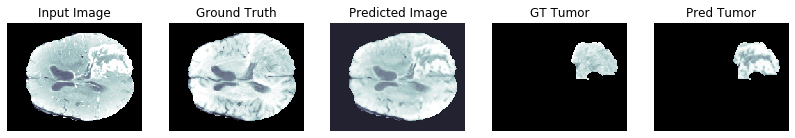

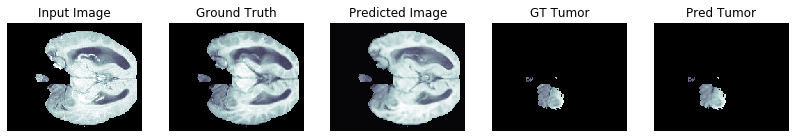

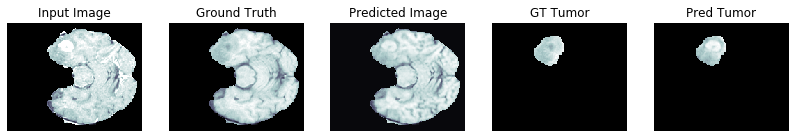

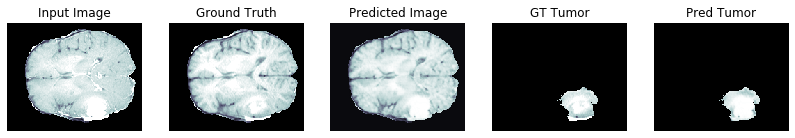

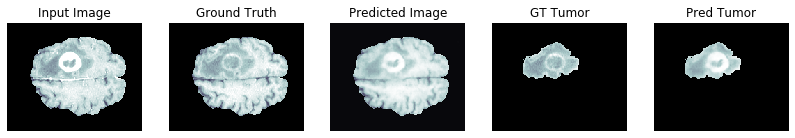

PSNR on validation set: 25.2023 ± 3.6684
MSE on validation set: 0.0039 ± 0.0028
SSIM on validation set: 0.8476 ± 0.0770

PSNR wrt tumor area on validation set: 36.4843 ± 10.6745
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9793 ± 0.0198

Generator loss on validation set: 2.0120 ± 0.6179
Discriminator loss on validation set: 1.3925 ± 0.0076

Epoch:  36
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
........................................................................

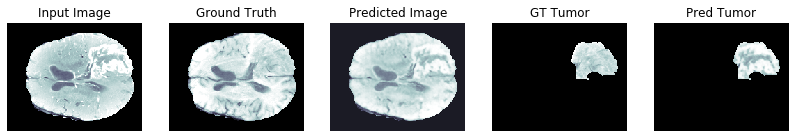

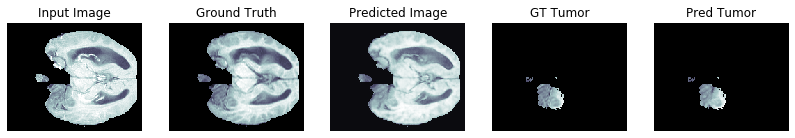

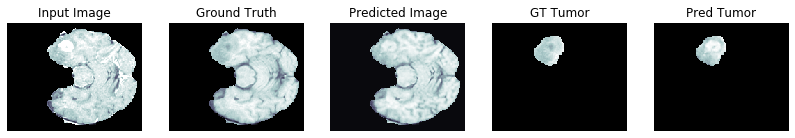

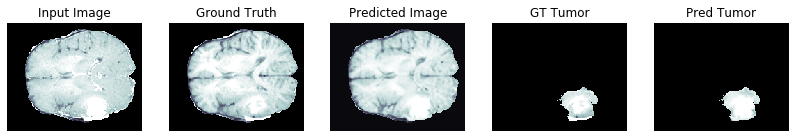

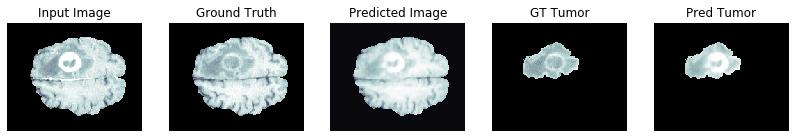

PSNR on validation set: 25.3245 ± 3.5847
MSE on validation set: 0.0037 ± 0.0025
SSIM on validation set: 0.8458 ± 0.0768

PSNR wrt tumor area on validation set: 36.3944 ± 10.1167
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9791 ± 0.0197

Generator loss on validation set: 2.0634 ± 0.6109
Discriminator loss on validation set: 1.4050 ± 0.0110

Time taken for epoch 36 is 419.60265254974365 sec


Epoch:  37
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

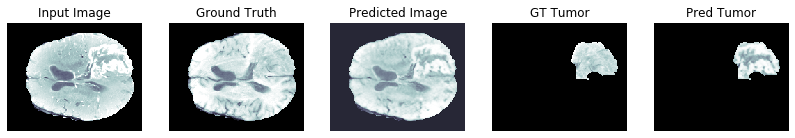

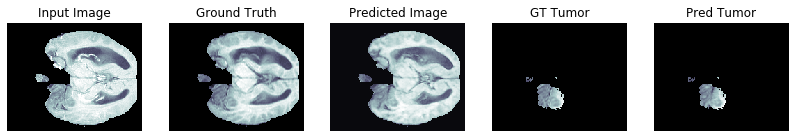

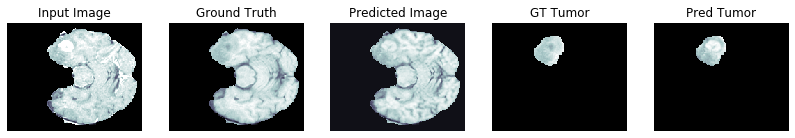

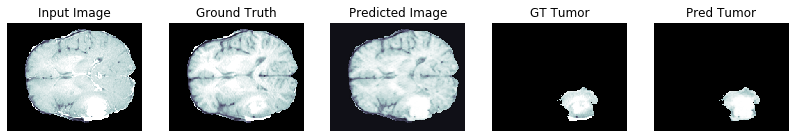

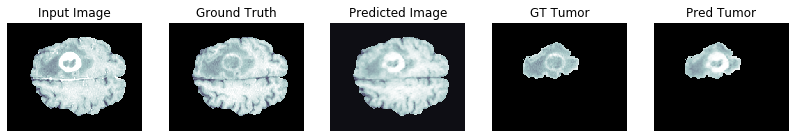

PSNR on validation set: 24.6279 ± 3.6919
MSE on validation set: 0.0045 ± 0.0031
SSIM on validation set: 0.8387 ± 0.0809

PSNR wrt tumor area on validation set: 35.9323 ± 9.5634
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9781 ± 0.0209

Generator loss on validation set: 2.0681 ± 0.6708
Discriminator loss on validation set: 1.3936 ± 0.0044

Time taken for epoch 37 is 413.6994273662567 sec


Epoch:  38
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

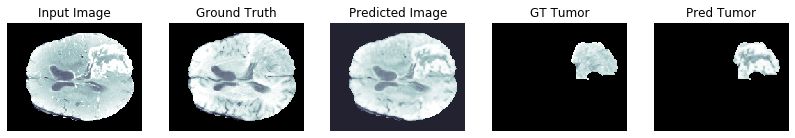

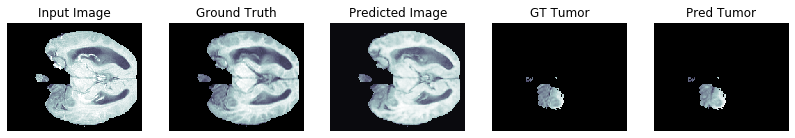

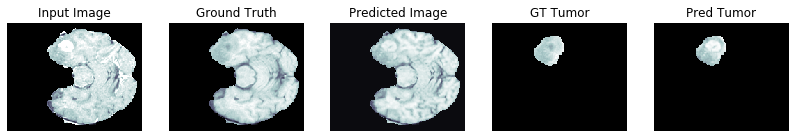

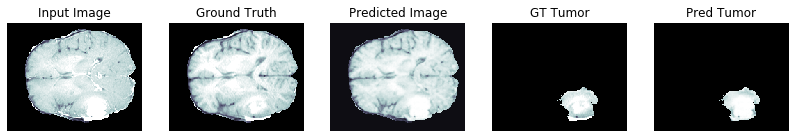

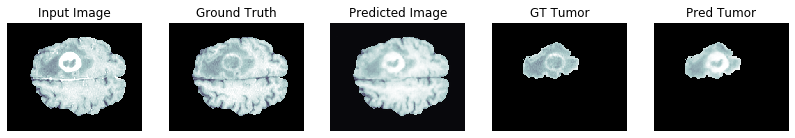

PSNR on validation set: 25.2370 ± 3.5972
MSE on validation set: 0.0038 ± 0.0026
SSIM on validation set: 0.8471 ± 0.0772

PSNR wrt tumor area on validation set: 36.3933 ± 11.3174
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9791 ± 0.0200

Generator loss on validation set: 2.0792 ± 0.6303
Discriminator loss on validation set: 1.4155 ± 0.0135

Time taken for epoch 38 is 413.729385137558 sec


Epoch:  39
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

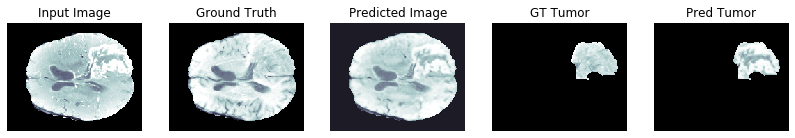

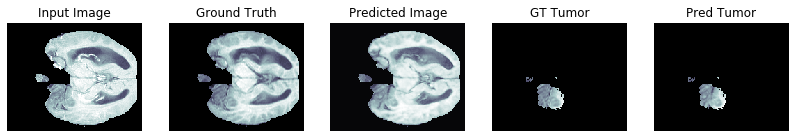

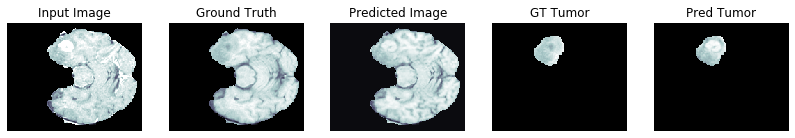

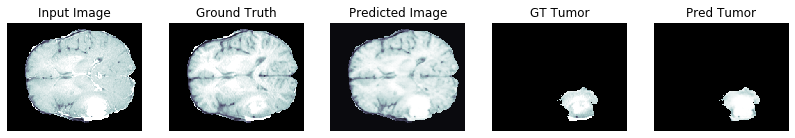

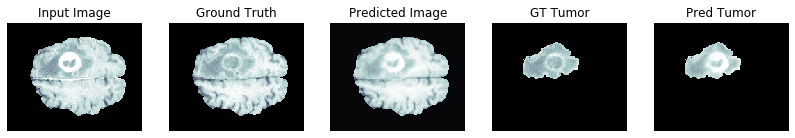

PSNR on validation set: 25.3863 ± 3.5848
MSE on validation set: 0.0037 ± 0.0026
SSIM on validation set: 0.8479 ± 0.0770

PSNR wrt tumor area on validation set: 36.3562 ± 11.3367
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9790 ± 0.0199

Generator loss on validation set: 2.1748 ± 0.6092
Discriminator loss on validation set: 1.4389 ± 0.0130

Time taken for epoch 39 is 413.97183418273926 sec


Epoch:  40
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

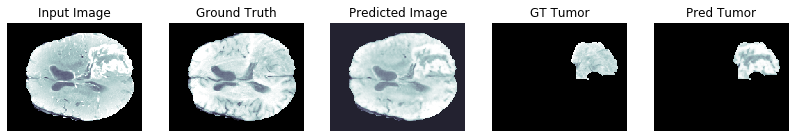

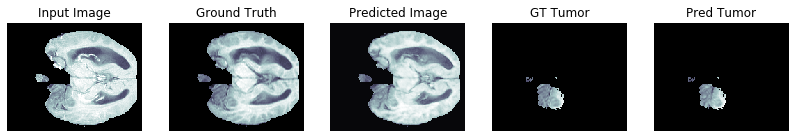

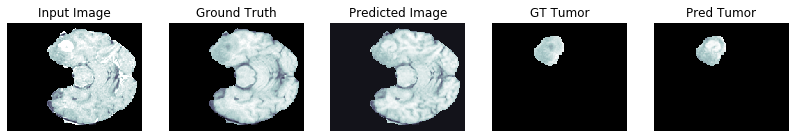

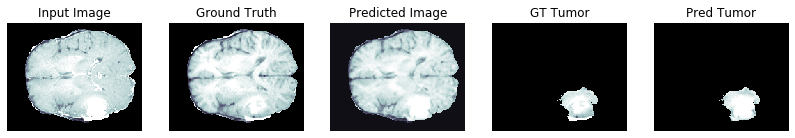

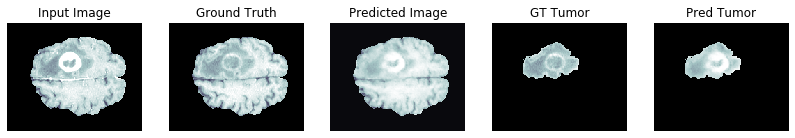

PSNR on validation set: 25.0685 ± 3.5395
MSE on validation set: 0.0040 ± 0.0027
SSIM on validation set: 0.8420 ± 0.0783

PSNR wrt tumor area on validation set: 36.2672 ± 9.8851
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9787 ± 0.0202

Generator loss on validation set: 2.0829 ± 0.6127
Discriminator loss on validation set: 1.4005 ± 0.0043

Saving checkpoint for epoch 40 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-9
Time taken for epoch 40 is 416.83411383628845 sec


Epoch:  41
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.............................................

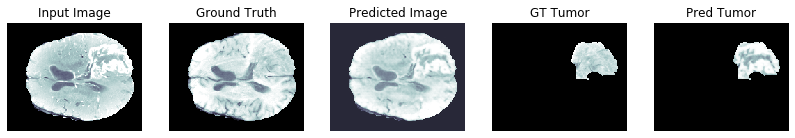

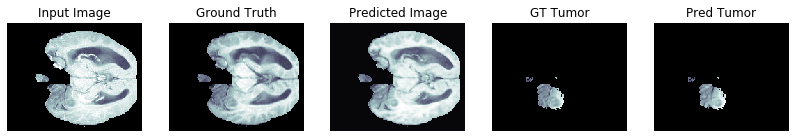

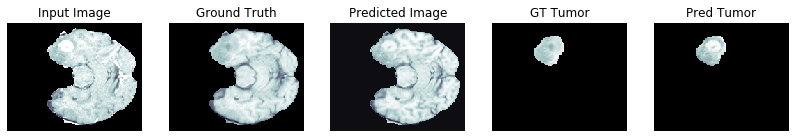

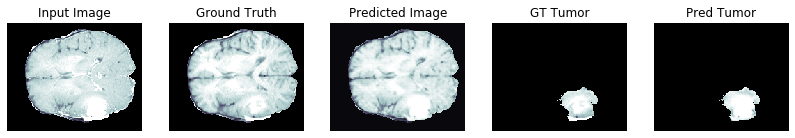

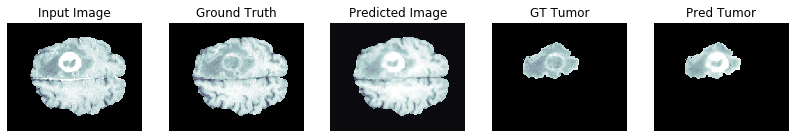

PSNR on validation set: 25.2878 ± 3.5652
MSE on validation set: 0.0038 ± 0.0027
SSIM on validation set: 0.8460 ± 0.0780

PSNR wrt tumor area on validation set: 36.0238 ± 10.3232
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9785 ± 0.0204

Generator loss on validation set: 2.0516 ± 0.6378
Discriminator loss on validation set: 1.4271 ± 0.0232

Time taken for epoch 41 is 413.8025152683258 sec


Epoch:  42
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

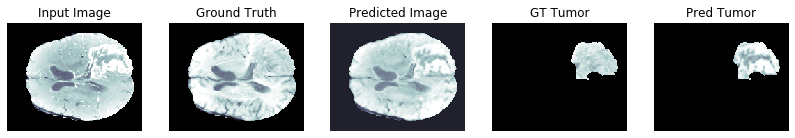

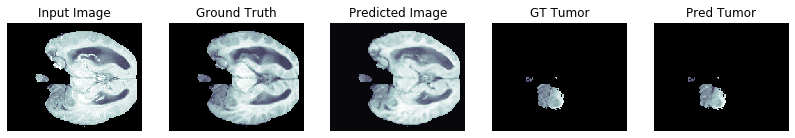

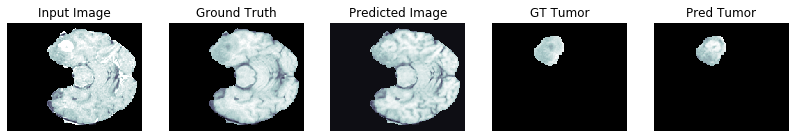

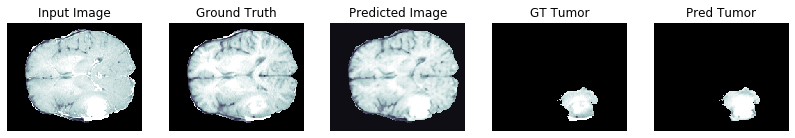

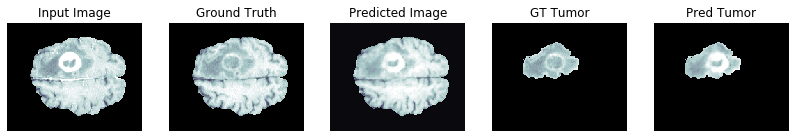

PSNR on validation set: 24.9310 ± 3.6101
MSE on validation set: 0.0041 ± 0.0029
SSIM on validation set: 0.8408 ± 0.0797

PSNR wrt tumor area on validation set: 36.1073 ± 10.3613
MSE wrt tumor area on validation set: 0.0007 ± 0.0008
SSIM wrt tumor area on validation set: 0.9783 ± 0.0206

Generator loss on validation set: 2.0628 ± 0.6470
Discriminator loss on validation set: 1.3987 ± 0.0087

Time taken for epoch 42 is 414.2161560058594 sec


Epoch:  43
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

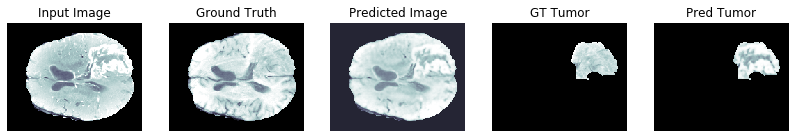

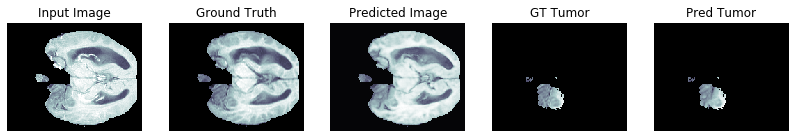

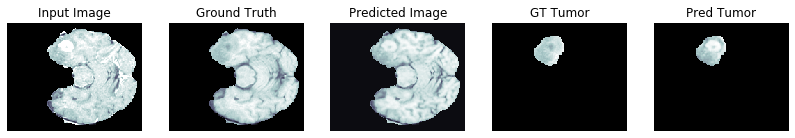

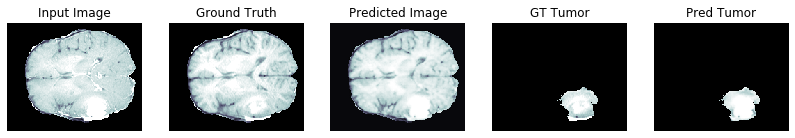

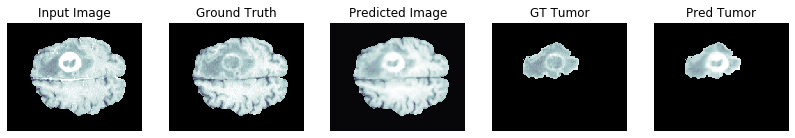

PSNR on validation set: 25.4364 ± 3.6011
MSE on validation set: 0.0037 ± 0.0026
SSIM on validation set: 0.8514 ± 0.0756

PSNR wrt tumor area on validation set: 36.2152 ± 9.4973
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9794 ± 0.0197

Generator loss on validation set: 2.0047 ± 0.6030
Discriminator loss on validation set: 1.3951 ± 0.0046

Time taken for epoch 43 is 413.9757857322693 sec


Epoch:  44
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

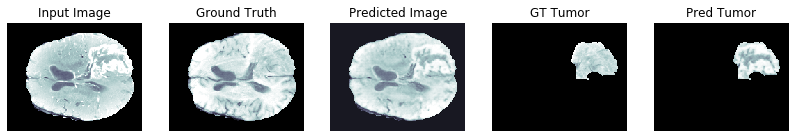

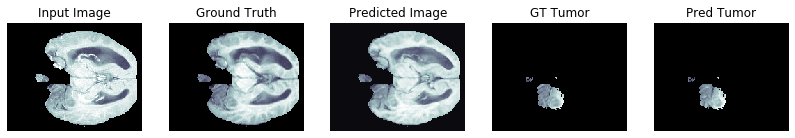

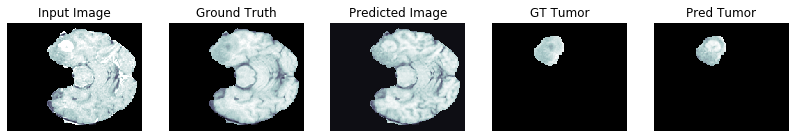

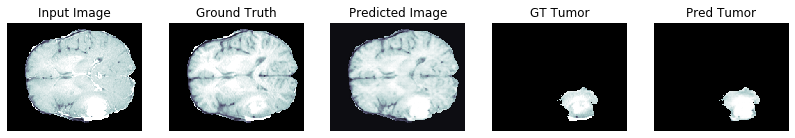

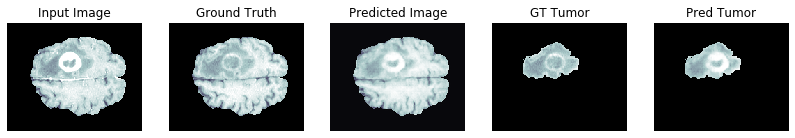

PSNR on validation set: 24.5822 ± 3.4781
MSE on validation set: 0.0044 ± 0.0029
SSIM on validation set: 0.8390 ± 0.0793

PSNR wrt tumor area on validation set: 36.2101 ± 9.9957
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9783 ± 0.0205

Generator loss on validation set: 2.0962 ± 0.6082
Discriminator loss on validation set: 1.4267 ± 0.0079

Time taken for epoch 44 is 413.558064699173 sec


Epoch:  45
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.......................

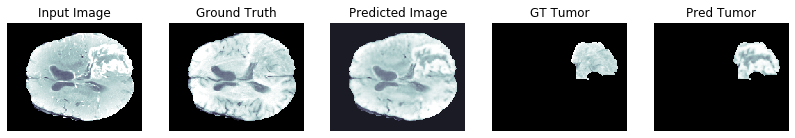

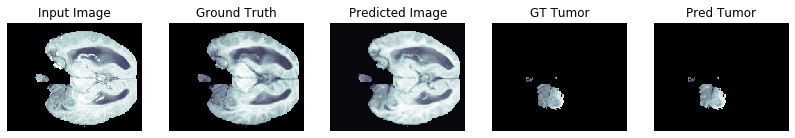

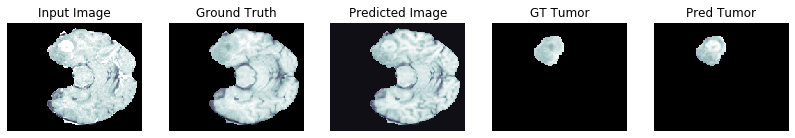

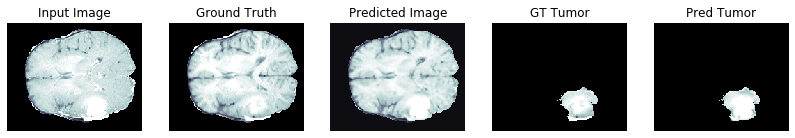

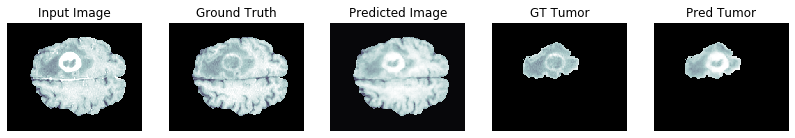

PSNR on validation set: 24.9530 ± 3.4968
MSE on validation set: 0.0041 ± 0.0027
SSIM on validation set: 0.8443 ± 0.0780

PSNR wrt tumor area on validation set: 36.1867 ± 10.0185
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9787 ± 0.0202

Generator loss on validation set: 2.0080 ± 0.6287
Discriminator loss on validation set: 1.3823 ± 0.0044

Saving checkpoint for epoch 45 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-10
Time taken for epoch 45 is 417.05334520339966 sec


Epoch:  46
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
...........................................

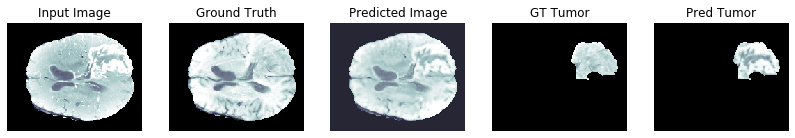

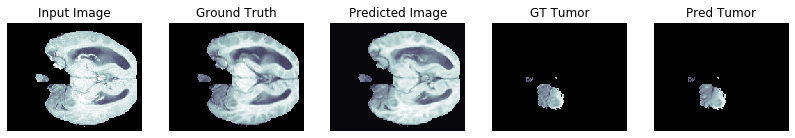

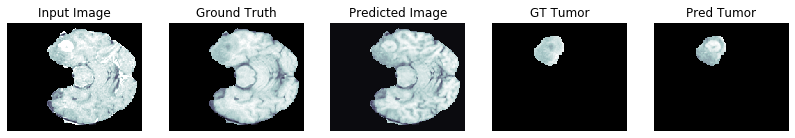

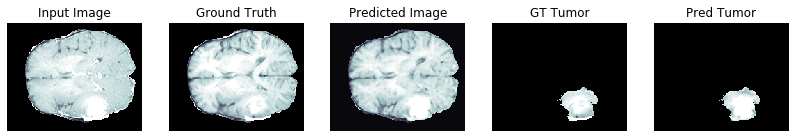

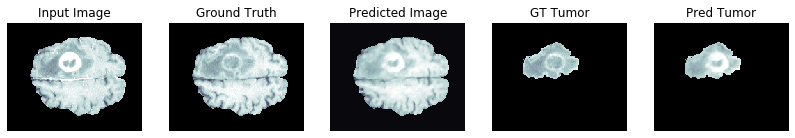

PSNR on validation set: 24.6615 ± 3.5498
MSE on validation set: 0.0044 ± 0.0029
SSIM on validation set: 0.8396 ± 0.0794

PSNR wrt tumor area on validation set: 35.8922 ± 8.5561
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9785 ± 0.0204

Generator loss on validation set: 2.0355 ± 0.6274
Discriminator loss on validation set: 1.3921 ± 0.0040

Time taken for epoch 46 is 413.6433868408203 sec


Epoch:  47
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

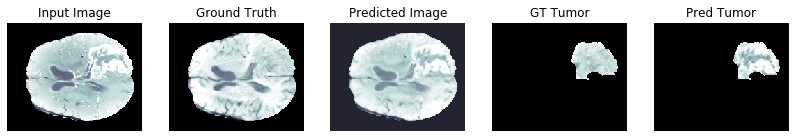

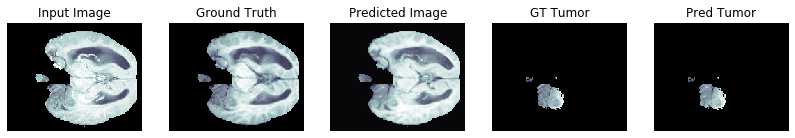

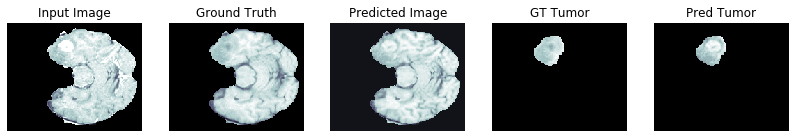

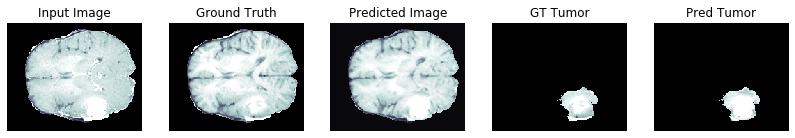

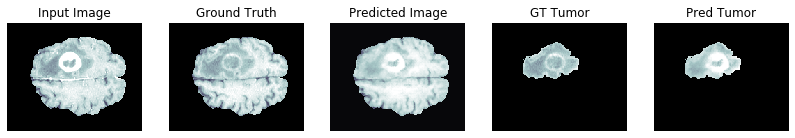

PSNR on validation set: 25.1905 ± 3.4797
MSE on validation set: 0.0039 ± 0.0026
SSIM on validation set: 0.8430 ± 0.0782

PSNR wrt tumor area on validation set: 36.3873 ± 11.7996
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9783 ± 0.0205

Generator loss on validation set: 2.1206 ± 0.6023
Discriminator loss on validation set: 1.4127 ± 0.0044

Time taken for epoch 47 is 413.7245738506317 sec


Epoch:  48
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

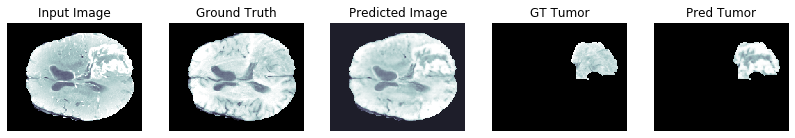

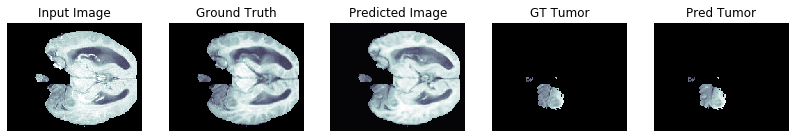

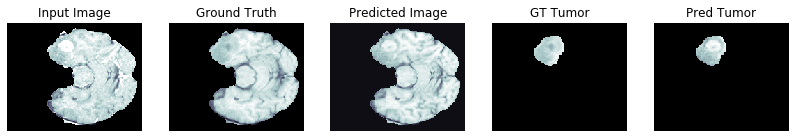

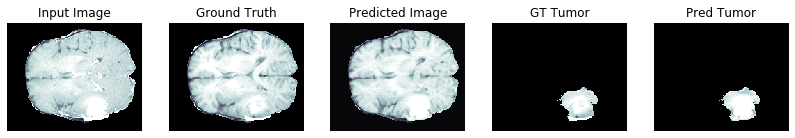

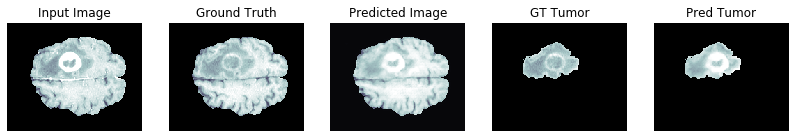

PSNR on validation set: 25.2654 ± 3.5541
MSE on validation set: 0.0038 ± 0.0026
SSIM on validation set: 0.8439 ± 0.0784

PSNR wrt tumor area on validation set: 36.0149 ± 9.5186
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9784 ± 0.0204

Generator loss on validation set: 2.1019 ± 0.5786
Discriminator loss on validation set: 1.4360 ± 0.0060

Time taken for epoch 48 is 414.4442939758301 sec


Epoch:  49
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

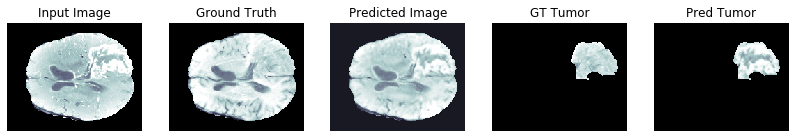

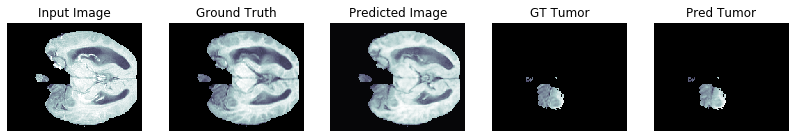

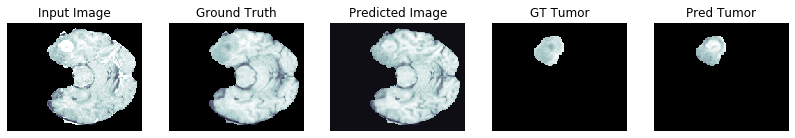

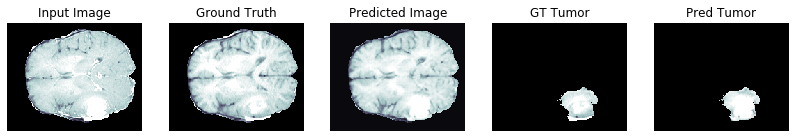

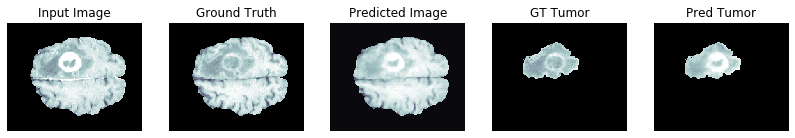

PSNR on validation set: 24.9881 ± 3.4784
MSE on validation set: 0.0040 ± 0.0026
SSIM on validation set: 0.8407 ± 0.0785

PSNR wrt tumor area on validation set: 36.1357 ± 9.3227
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9784 ± 0.0203

Generator loss on validation set: 2.0279 ± 0.5885
Discriminator loss on validation set: 1.4027 ± 0.0029

Time taken for epoch 49 is 414.15626883506775 sec


Epoch:  50
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

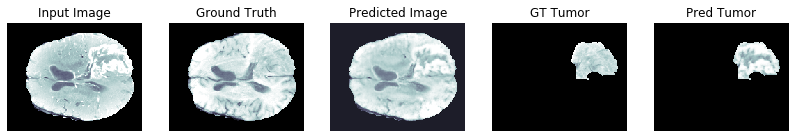

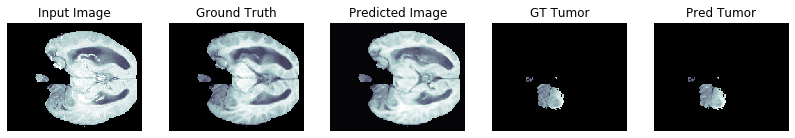

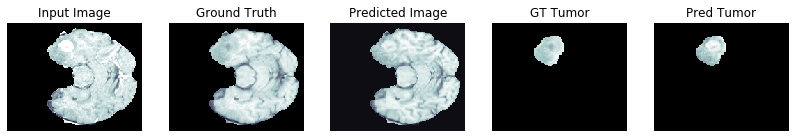

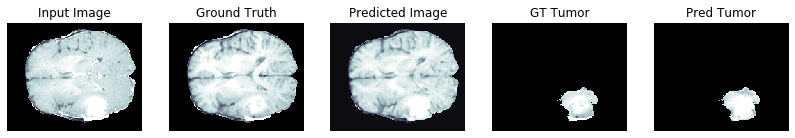

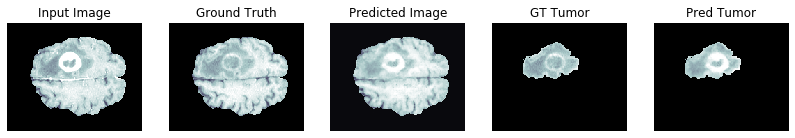

PSNR on validation set: 25.0477 ± 3.5572
MSE on validation set: 0.0040 ± 0.0026
SSIM on validation set: 0.8377 ± 0.0808

PSNR wrt tumor area on validation set: 36.0943 ± 9.3990
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9780 ± 0.0208

Generator loss on validation set: 2.0969 ± 0.6244
Discriminator loss on validation set: 1.4067 ± 0.0095

Saving checkpoint for epoch 50 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-11
Time taken for epoch 50 is 417.11162877082825 sec


Epoch:  51
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
............................................

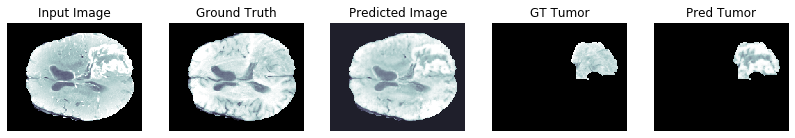

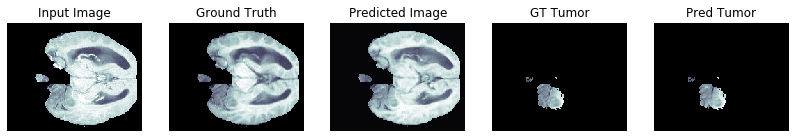

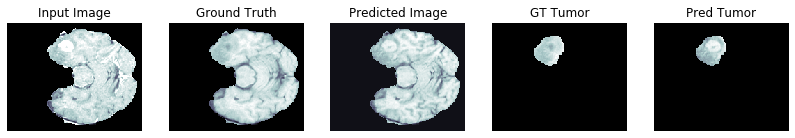

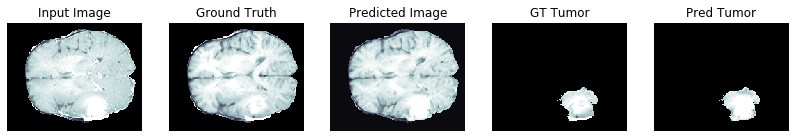

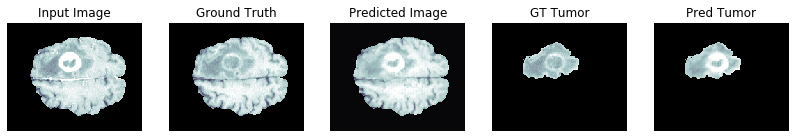

PSNR on validation set: 25.0298 ± 3.5387
MSE on validation set: 0.0040 ± 0.0027
SSIM on validation set: 0.8379 ± 0.0807

PSNR wrt tumor area on validation set: 36.0528 ± 10.1096
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9779 ± 0.0208

Generator loss on validation set: 2.0777 ± 0.6306
Discriminator loss on validation set: 1.3955 ± 0.0052

Time taken for epoch 51 is 415.0094618797302 sec


Epoch:  52
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

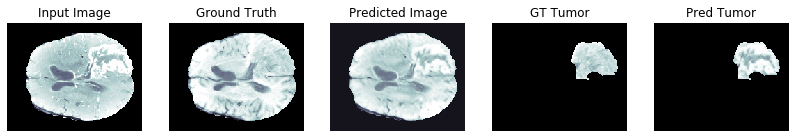

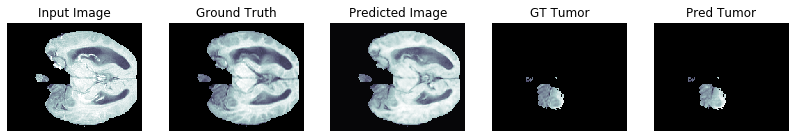

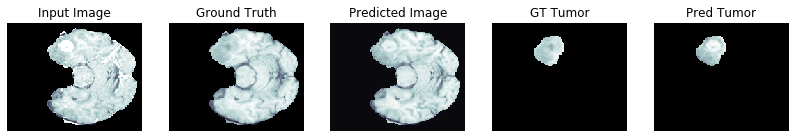

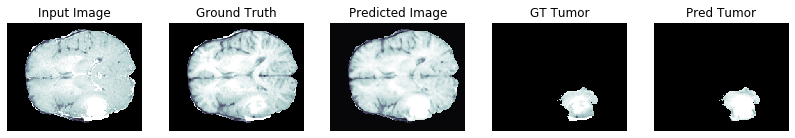

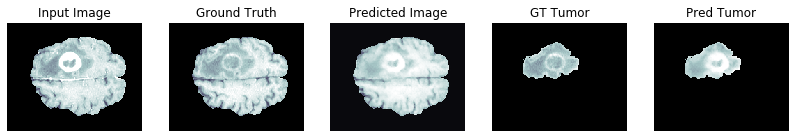

PSNR on validation set: 25.2287 ± 3.5245
MSE on validation set: 0.0038 ± 0.0026
SSIM on validation set: 0.8443 ± 0.0776

PSNR wrt tumor area on validation set: 36.3564 ± 11.1342
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9786 ± 0.0201

Generator loss on validation set: 2.0544 ± 0.5787
Discriminator loss on validation set: 1.4121 ± 0.0053

Time taken for epoch 52 is 414.58231234550476 sec


Epoch:  53
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

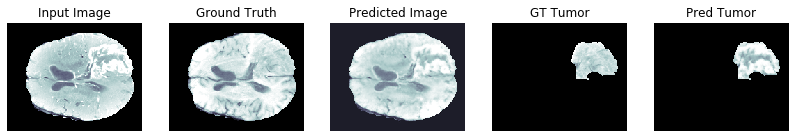

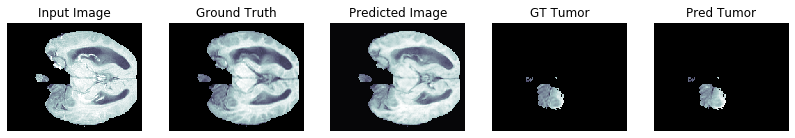

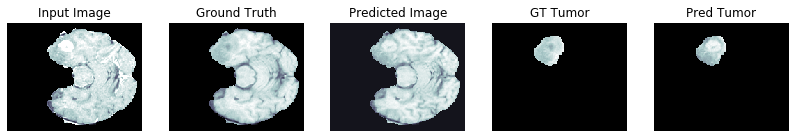

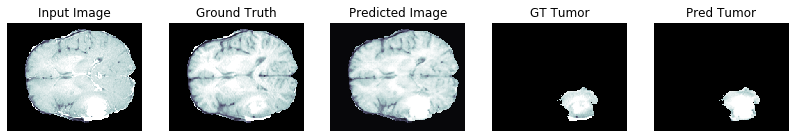

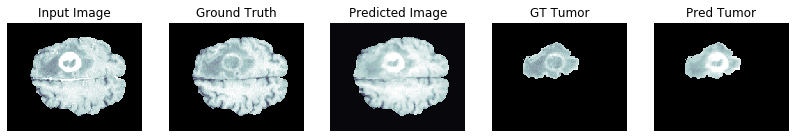

PSNR on validation set: 25.0627 ± 3.5147
MSE on validation set: 0.0040 ± 0.0027
SSIM on validation set: 0.8389 ± 0.0797

PSNR wrt tumor area on validation set: 36.2962 ± 11.1718
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9781 ± 0.0206

Generator loss on validation set: 2.0825 ± 0.5959
Discriminator loss on validation set: 1.4122 ± 0.0052

Time taken for epoch 53 is 414.8336567878723 sec


Epoch:  54
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

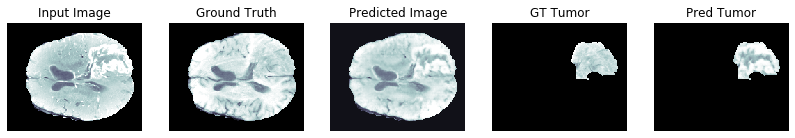

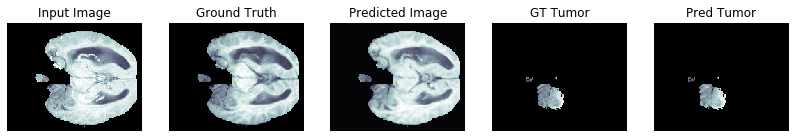

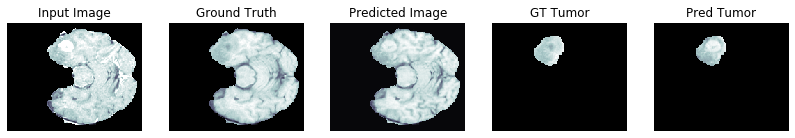

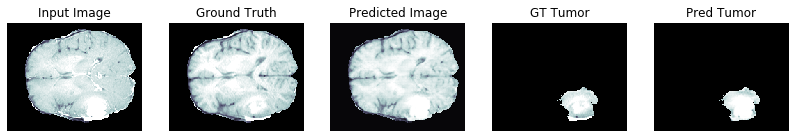

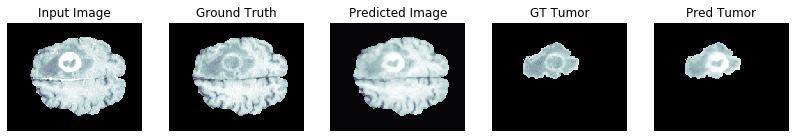

PSNR on validation set: 25.2545 ± 3.4993
MSE on validation set: 0.0038 ± 0.0025
SSIM on validation set: 0.8427 ± 0.0785

PSNR wrt tumor area on validation set: 36.0636 ± 8.8255
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9784 ± 0.0202

Generator loss on validation set: 2.0002 ± 0.5795
Discriminator loss on validation set: 1.4013 ± 0.0038

Time taken for epoch 54 is 414.9463884830475 sec


Epoch:  55
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

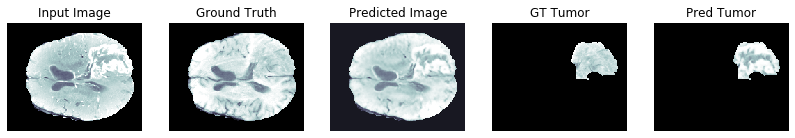

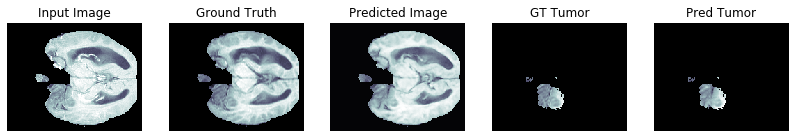

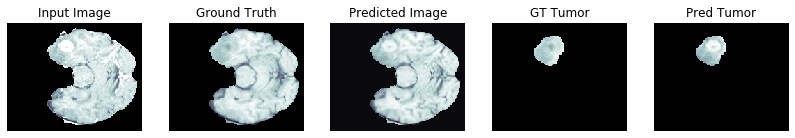

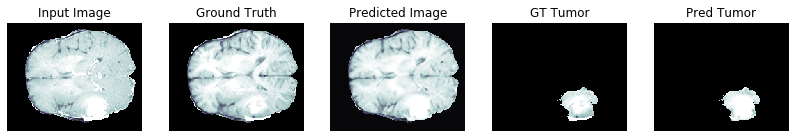

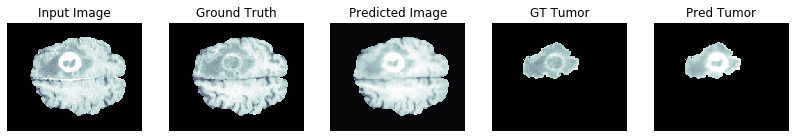

PSNR on validation set: 25.4356 ± 3.6084
MSE on validation set: 0.0037 ± 0.0026
SSIM on validation set: 0.8487 ± 0.0767

PSNR wrt tumor area on validation set: 36.1977 ± 9.7492
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9789 ± 0.0200

Generator loss on validation set: 1.9754 ± 0.6045
Discriminator loss on validation set: 1.3925 ± 0.0073

Saving checkpoint for epoch 55 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-12
Time taken for epoch 55 is 417.9759728908539 sec


Epoch:  56
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
.............................................

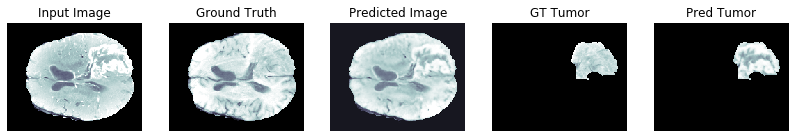

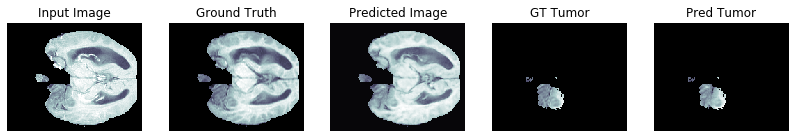

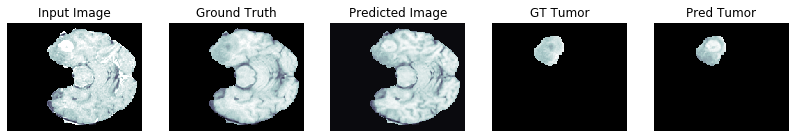

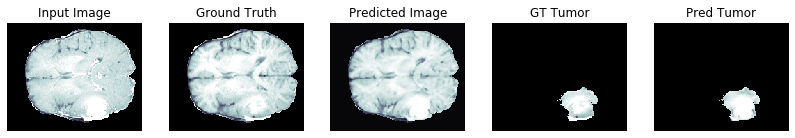

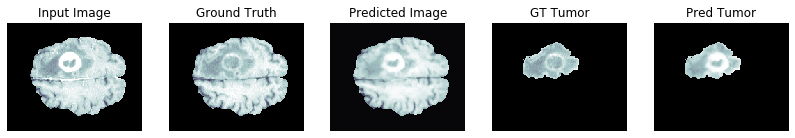

PSNR on validation set: 25.1604 ± 3.5577
MSE on validation set: 0.0039 ± 0.0027
SSIM on validation set: 0.8452 ± 0.0783

PSNR wrt tumor area on validation set: 36.2800 ± 10.4147
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9788 ± 0.0203

Generator loss on validation set: 1.9655 ± 0.6274
Discriminator loss on validation set: 1.3891 ± 0.0115

Time taken for epoch 56 is 414.7705092430115 sec


Epoch:  57
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

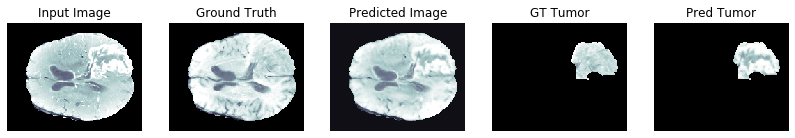

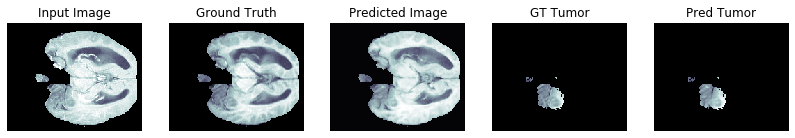

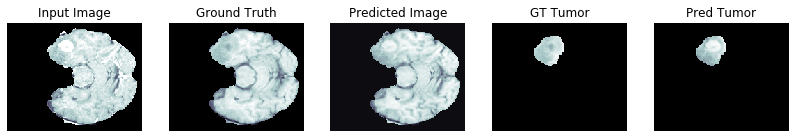

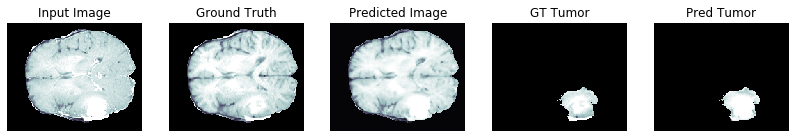

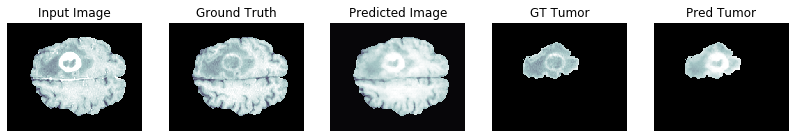

PSNR on validation set: 25.4094 ± 3.5424
MSE on validation set: 0.0037 ± 0.0025
SSIM on validation set: 0.8458 ± 0.0771

PSNR wrt tumor area on validation set: 36.2668 ± 10.5365
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9788 ± 0.0199

Generator loss on validation set: 2.0697 ± 0.6105
Discriminator loss on validation set: 1.4148 ± 0.0105

Time taken for epoch 57 is 414.8387084007263 sec


Epoch:  58
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

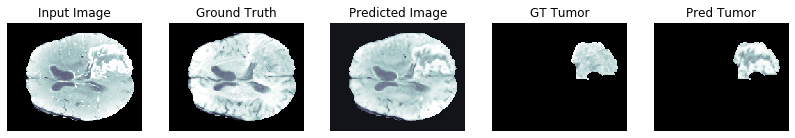

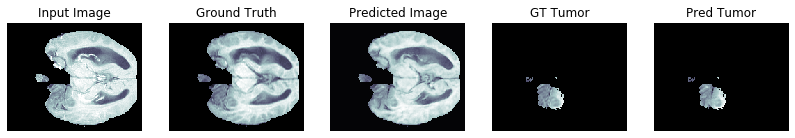

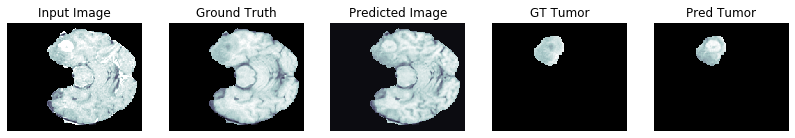

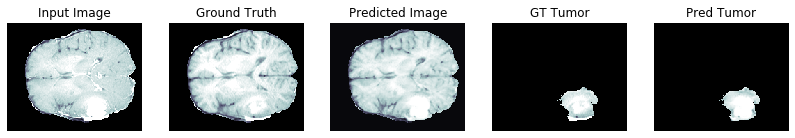

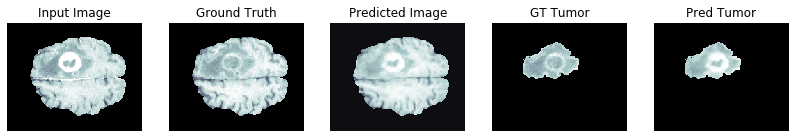

PSNR on validation set: 24.9331 ± 3.5652
MSE on validation set: 0.0041 ± 0.0028
SSIM on validation set: 0.8411 ± 0.0798

PSNR wrt tumor area on validation set: 36.0101 ± 8.4205
MSE wrt tumor area on validation set: 0.0006 ± 0.0007
SSIM wrt tumor area on validation set: 0.9785 ± 0.0204

Generator loss on validation set: 2.0952 ± 0.6397
Discriminator loss on validation set: 1.4019 ± 0.0036

Time taken for epoch 58 is 414.6017837524414 sec


Epoch:  59
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

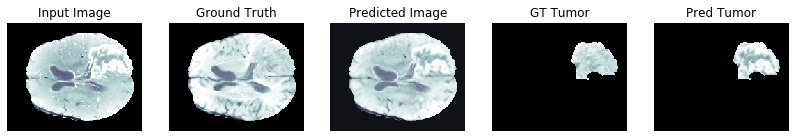

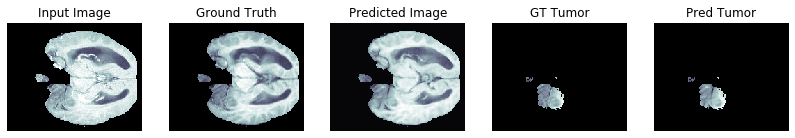

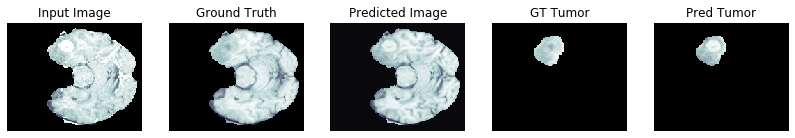

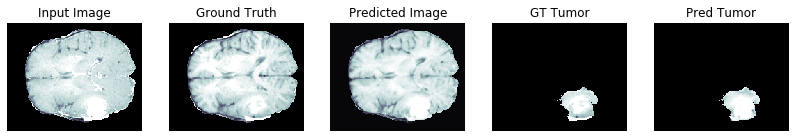

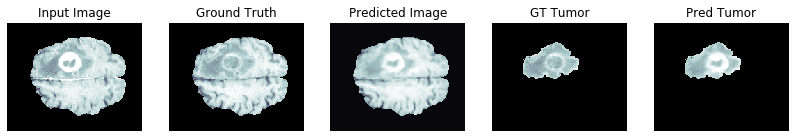

PSNR on validation set: 25.2201 ± 3.5625
MSE on validation set: 0.0039 ± 0.0026
SSIM on validation set: 0.8453 ± 0.0781

PSNR wrt tumor area on validation set: 36.2797 ± 10.4755
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9788 ± 0.0202

Generator loss on validation set: 1.9704 ± 0.6167
Discriminator loss on validation set: 1.3872 ± 0.0025

Time taken for epoch 59 is 414.6587178707123 sec


Epoch:  60
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

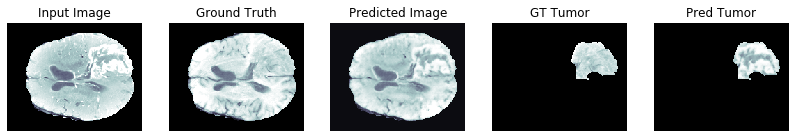

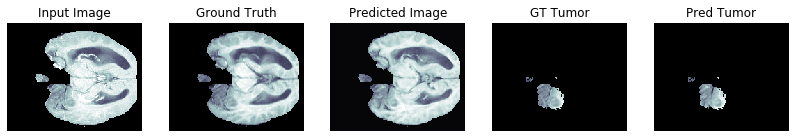

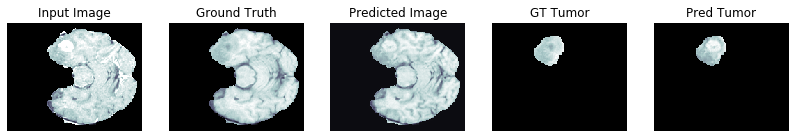

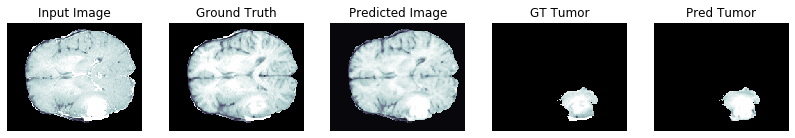

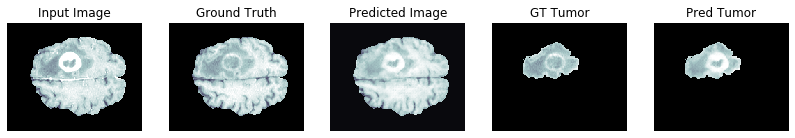

PSNR on validation set: 24.9174 ± 3.5543
MSE on validation set: 0.0041 ± 0.0028
SSIM on validation set: 0.8391 ± 0.0808

PSNR wrt tumor area on validation set: 36.2781 ± 11.8853
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9780 ± 0.0209

Generator loss on validation set: 1.9509 ± 0.6129
Discriminator loss on validation set: 1.4405 ± 0.0339

Saving checkpoint for epoch 60 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-13
Time taken for epoch 60 is 418.9522783756256 sec


Epoch:  61
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
............................................

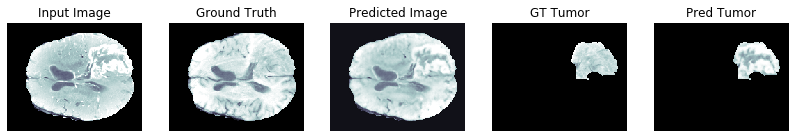

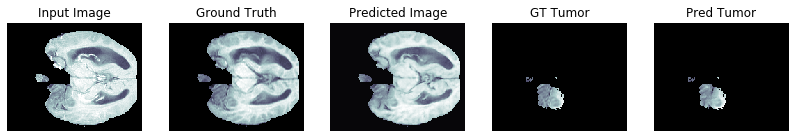

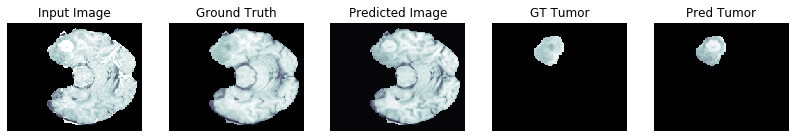

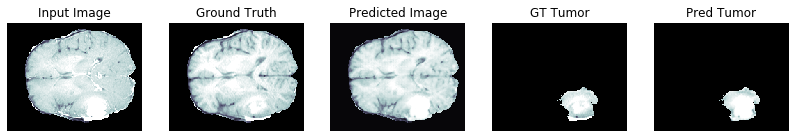

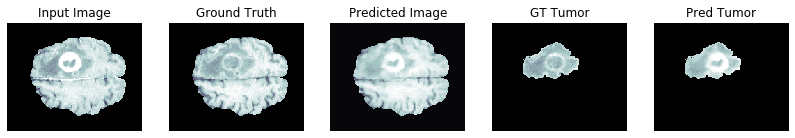

PSNR on validation set: 25.2333 ± 3.5333
MSE on validation set: 0.0038 ± 0.0026
SSIM on validation set: 0.8443 ± 0.0785

PSNR wrt tumor area on validation set: 36.2851 ± 10.5519
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9788 ± 0.0201

Generator loss on validation set: 2.1174 ± 0.7456
Discriminator loss on validation set: 1.6846 ± 0.1019

Time taken for epoch 61 is 415.78103518486023 sec


Epoch:  62
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

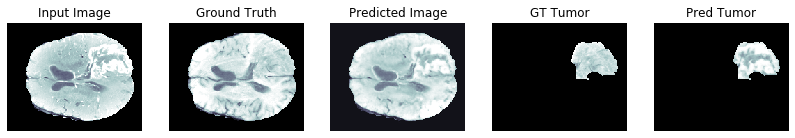

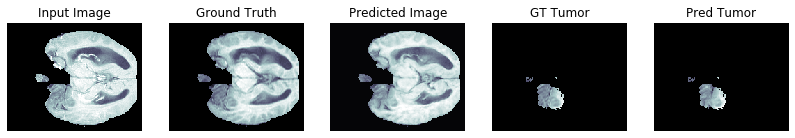

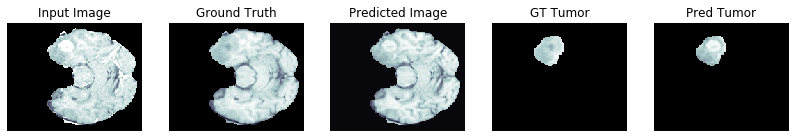

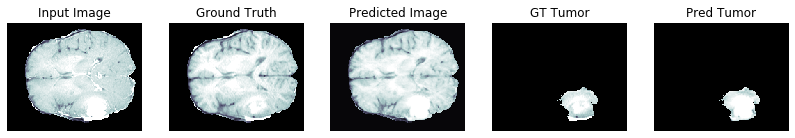

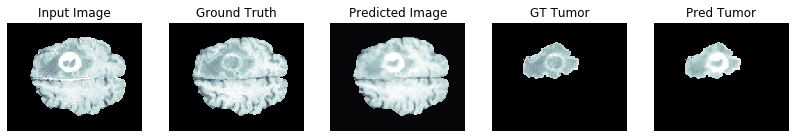

PSNR on validation set: 25.2437 ± 3.4792
MSE on validation set: 0.0038 ± 0.0025
SSIM on validation set: 0.8421 ± 0.0790

PSNR wrt tumor area on validation set: 36.0888 ± 9.5757
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9783 ± 0.0204

Generator loss on validation set: 1.9392 ± 0.5893
Discriminator loss on validation set: 1.3957 ± 0.0056

Time taken for epoch 62 is 416.1214005947113 sec


Epoch:  63
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

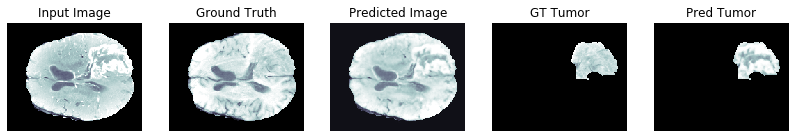

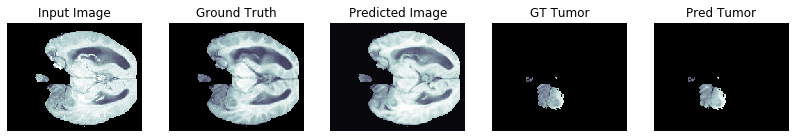

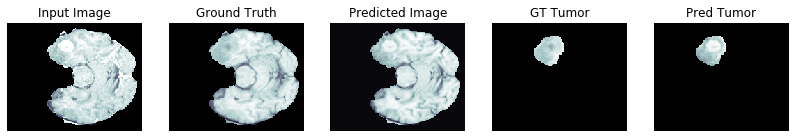

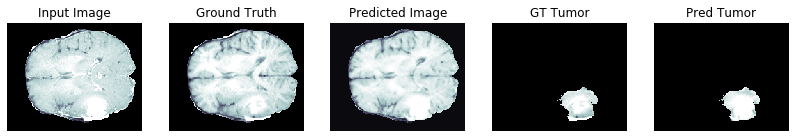

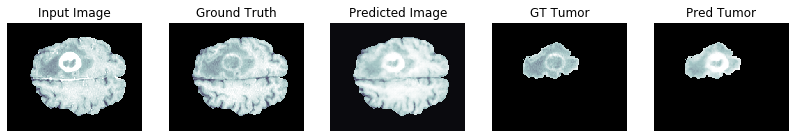

PSNR on validation set: 25.3686 ± 3.4991
MSE on validation set: 0.0037 ± 0.0025
SSIM on validation set: 0.8461 ± 0.0771

PSNR wrt tumor area on validation set: 36.1547 ± 10.7180
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9786 ± 0.0201

Generator loss on validation set: 1.9963 ± 0.5827
Discriminator loss on validation set: 1.3871 ± 0.0071

Time taken for epoch 63 is 415.9484133720398 sec


Epoch:  64
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

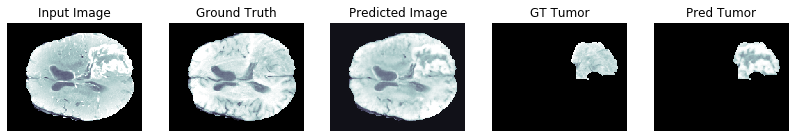

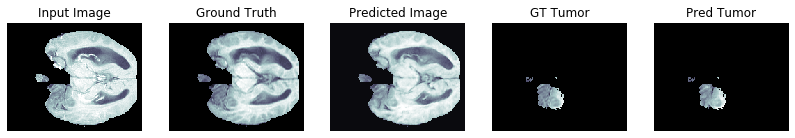

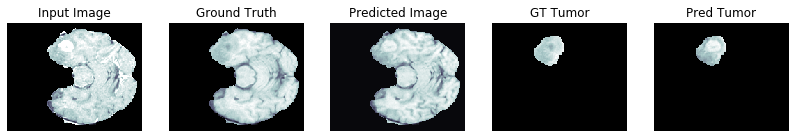

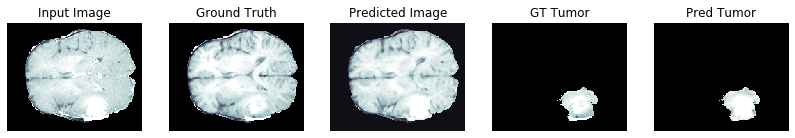

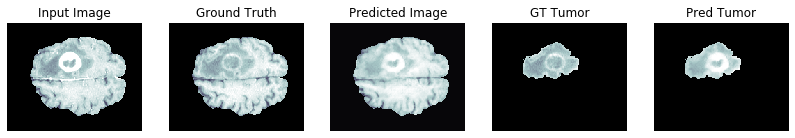

PSNR on validation set: 25.1766 ± 3.5307
MSE on validation set: 0.0039 ± 0.0025
SSIM on validation set: 0.8398 ± 0.0798

PSNR wrt tumor area on validation set: 36.1480 ± 10.0758
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9781 ± 0.0206

Generator loss on validation set: 2.0939 ± 0.6269
Discriminator loss on validation set: 1.3954 ± 0.0166

Time taken for epoch 64 is 416.26011395454407 sec


Epoch:  65
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

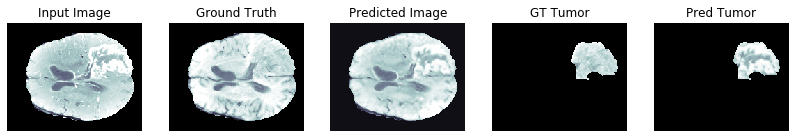

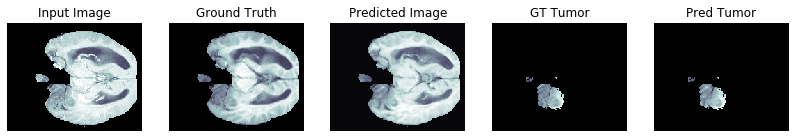

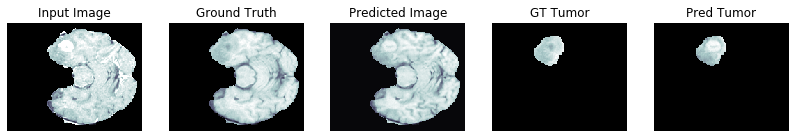

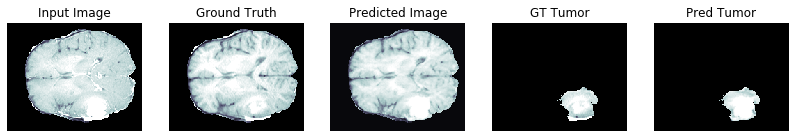

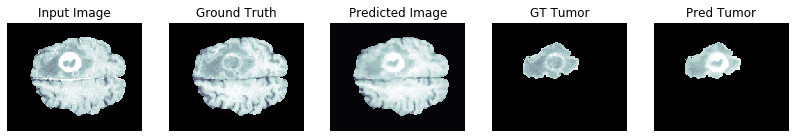

PSNR on validation set: 25.2473 ± 3.5453
MSE on validation set: 0.0038 ± 0.0025
SSIM on validation set: 0.8419 ± 0.0792

PSNR wrt tumor area on validation set: 36.3202 ± 10.9967
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9784 ± 0.0203

Generator loss on validation set: 1.9263 ± 0.6118
Discriminator loss on validation set: 1.3879 ± 0.0021

Saving checkpoint for epoch 65 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-14
Time taken for epoch 65 is 419.12550830841064 sec


Epoch:  66
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
...........................................

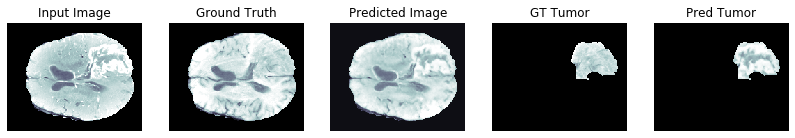

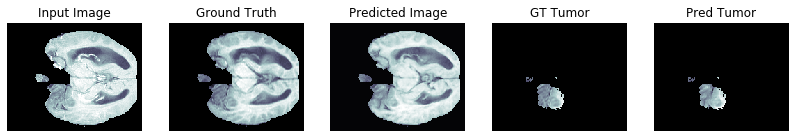

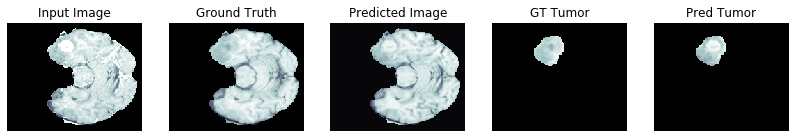

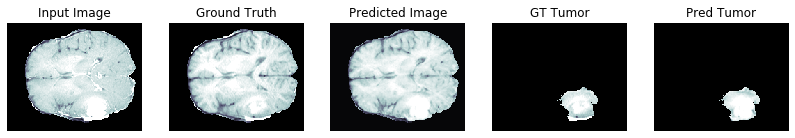

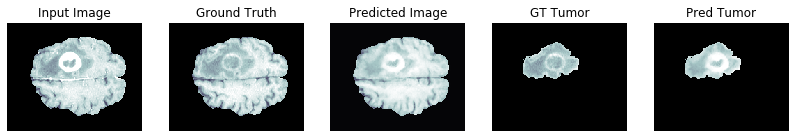

PSNR on validation set: 25.3317 ± 3.5418
MSE on validation set: 0.0037 ± 0.0024
SSIM on validation set: 0.8433 ± 0.0786

PSNR wrt tumor area on validation set: 36.1554 ± 9.3495
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9784 ± 0.0203

Generator loss on validation set: 2.0532 ± 0.6107
Discriminator loss on validation set: 1.3990 ± 0.0135

Time taken for epoch 66 is 416.4303414821625 sec


Epoch:  67
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

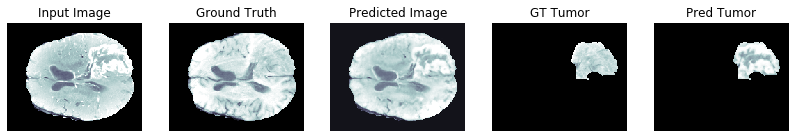

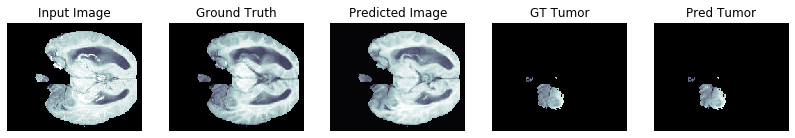

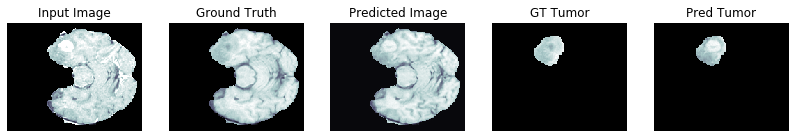

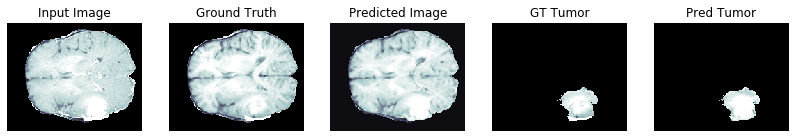

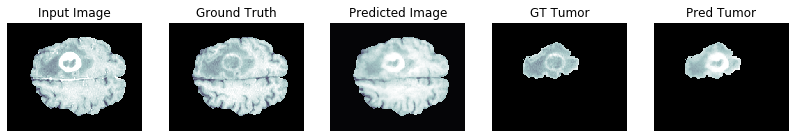

PSNR on validation set: 25.2138 ± 3.5804
MSE on validation set: 0.0039 ± 0.0026
SSIM on validation set: 0.8412 ± 0.0799

PSNR wrt tumor area on validation set: 36.1968 ± 10.6481
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9782 ± 0.0206

Generator loss on validation set: 1.9645 ± 0.6302
Discriminator loss on validation set: 1.3925 ± 0.0045

Time taken for epoch 67 is 416.03493905067444 sec


Epoch:  68
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
....................

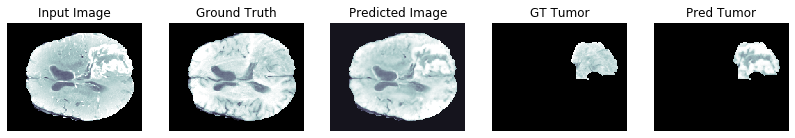

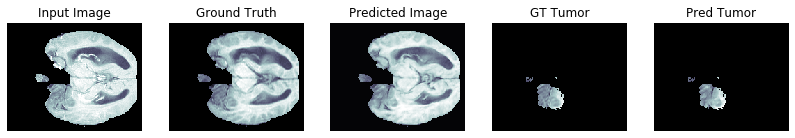

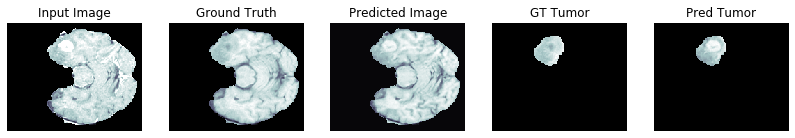

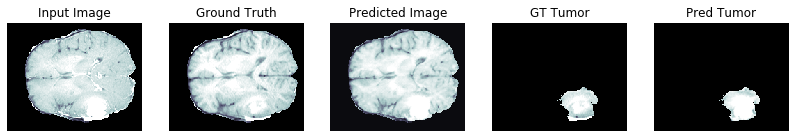

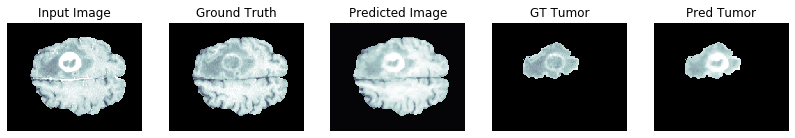

PSNR on validation set: 25.3142 ± 3.5387
MSE on validation set: 0.0038 ± 0.0025
SSIM on validation set: 0.8430 ± 0.0789

PSNR wrt tumor area on validation set: 36.3198 ± 11.6544
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9785 ± 0.0203

Generator loss on validation set: 1.9742 ± 0.5899
Discriminator loss on validation set: 1.4004 ± 0.0069

Time taken for epoch 68 is 416.2589542865753 sec


Epoch:  69
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
.....................

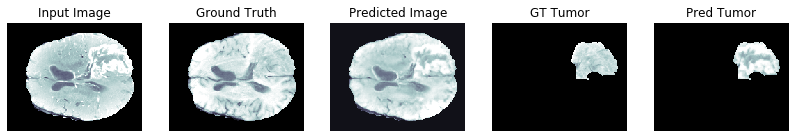

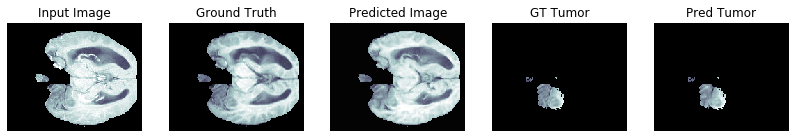

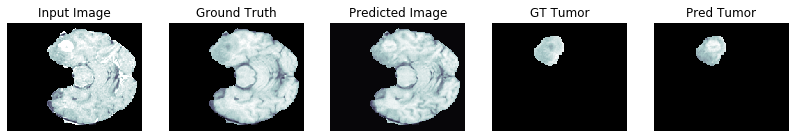

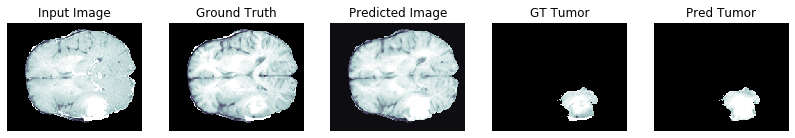

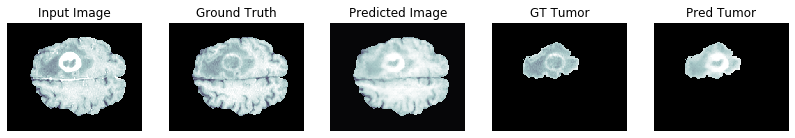

PSNR on validation set: 25.1194 ± 3.4981
MSE on validation set: 0.0039 ± 0.0025
SSIM on validation set: 0.8368 ± 0.0806

PSNR wrt tumor area on validation set: 36.0596 ± 9.3828
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9779 ± 0.0207

Generator loss on validation set: 2.0278 ± 0.6185
Discriminator loss on validation set: 1.3991 ± 0.0103

Time taken for epoch 69 is 416.2373993396759 sec


Epoch:  70
...................................................................................................
100
....................................................................................................
200
....................................................................................................
300
....................................................................................................
400
....................................................................................................
500
......................

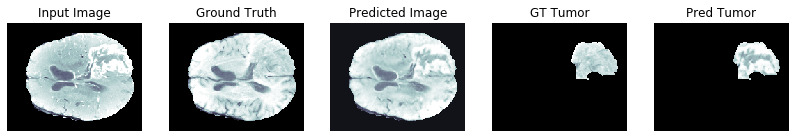

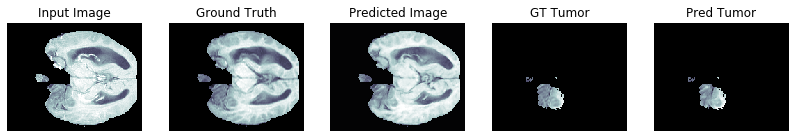

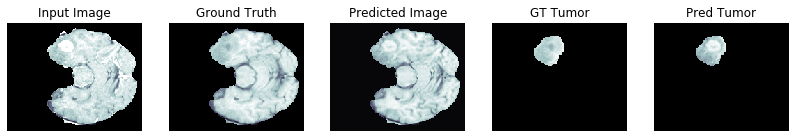

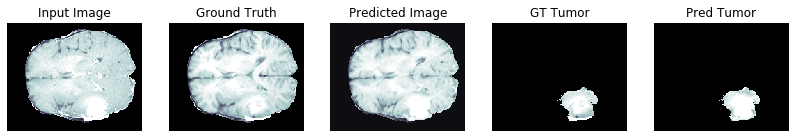

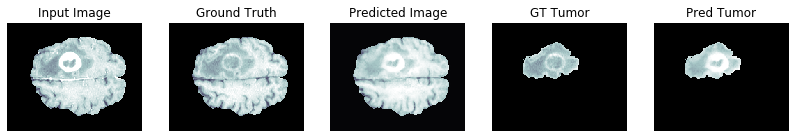

PSNR on validation set: 25.2819 ± 3.5385
MSE on validation set: 0.0038 ± 0.0026
SSIM on validation set: 0.8417 ± 0.0795

PSNR wrt tumor area on validation set: 36.0252 ± 9.5010
MSE wrt tumor area on validation set: 0.0007 ± 0.0007
SSIM wrt tumor area on validation set: 0.9782 ± 0.0205

Generator loss on validation set: 1.9410 ± 0.5868
Discriminator loss on validation set: 1.4002 ± 0.0068

Saving checkpoint for epoch 70 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-15
Time taken for epoch 70 is 419.2949321269989 sec

Saving FINAL checkpoint for epoch 70 at ./drive/My Drive/checkpoints/gen_t1_p2p/ckpt-16


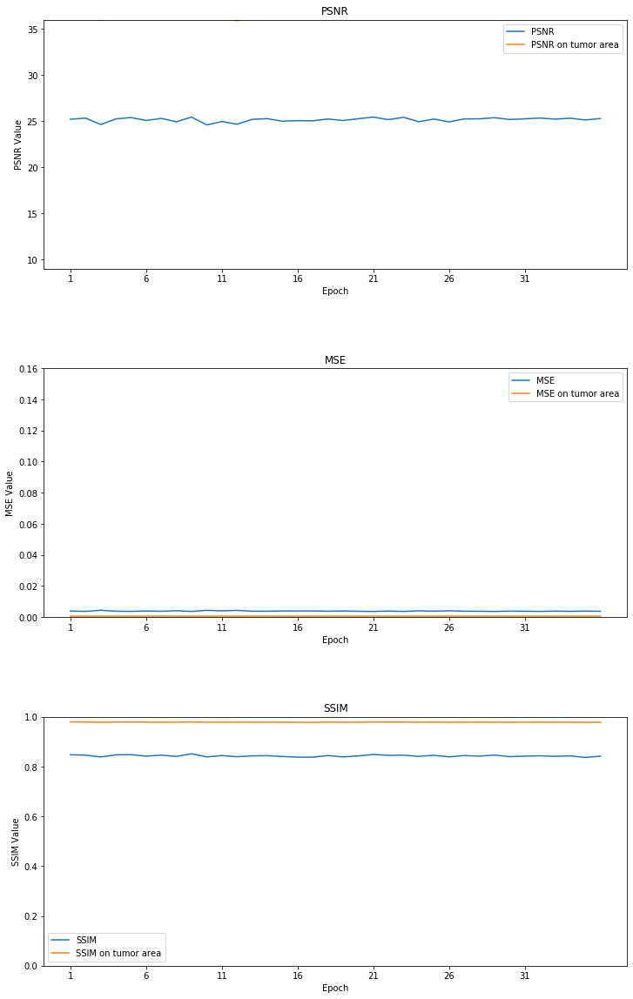

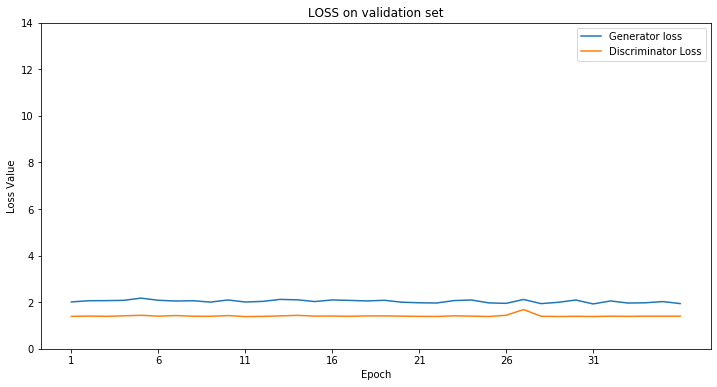

In [43]:
EPOCHS = 35
save_checkpoint = True         # want to save new checkpoints ? 
save_final_models = False       # want to save the model at the end of the training ? 
epochs_already_trained = 35      # this is just for the print. 
evaluate_tumor_quality = True   # compute & print metrics on tumor area ?
print_loss = True               # compute & print the validation loss ?


# Initialize the models, so that I don't have to restart the runtime again.

if tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, False):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)

elif tf.equal(evaluate_tumor_quality, False) and tf.equal(print_loss, True):
    psnr, mse, ssim, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                    epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)
    plot_loss(gen_loss, dis_loss)

elif tf.equal(evaluate_tumor_quality, True) and tf.equal(print_loss, True):
    psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor, gen_loss, dis_loss = fit(training, EPOCHS, validation, save_checkpoint, 
                                                        epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim, psnr_tumor, mse_tumor, ssim_tumor)
    plot_loss(gen_loss, dis_loss)
else:
    psnr, mse, ssim = fit(training, EPOCHS, validation, save_checkpoint, 
                                                      epochs_already_trained, evaluate_tumor_quality, print_loss)
    plot_metrics(psnr, mse, ssim)

# at the end, I'll save the models (I would need only the gen, but let's sayve also the disc  )
# (it saves the entire model to a HDF5 file)

if save_final_models:
    generator.save('drive/My Drive/MRI-generation/gen_T1c_35ep_p2p.h5')

##Evaluating the final model with the test set

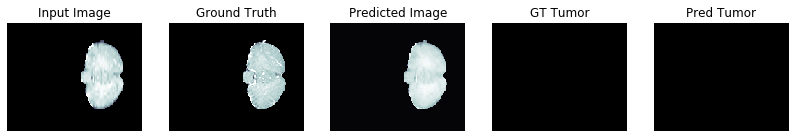

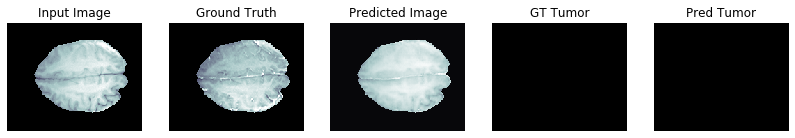

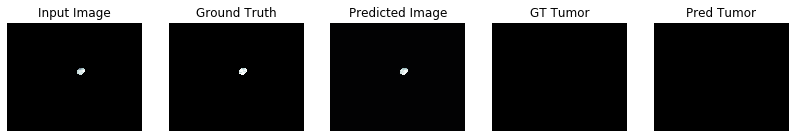

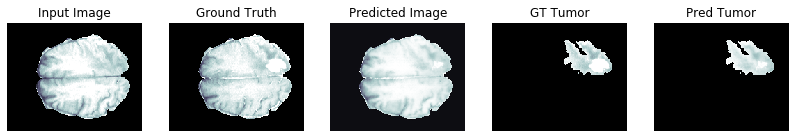

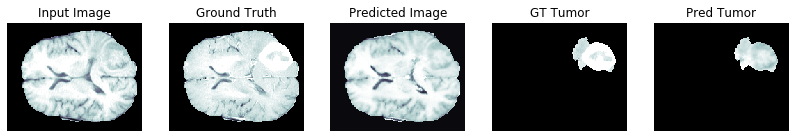

PSNR on test set: 24.6165 ± 4.0755
MSE on test set: 0.0051 ± 0.0048
SSIM on test set: 0.8139 ± 0.0996

PSNR wrt tumor area on test set: 35.8285 ± 14.7486
MSE wrt tumor area on test set: 0.0012 ± 0.0020
SSIM wrt tumor area on test set: 0.9694 ± 0.0383

Generator loss on test set: 2.0334 ± 0.4664
Discriminator loss on test set: 1.6062 ± 0.0288


(<tf.Tensor: shape=(), dtype=float32, numpy=24.616549>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.005066051>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.81387377>,
 <tf.Tensor: shape=(), dtype=float32, numpy=35.828503>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.001248471>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.96943>,
 <tf.Tensor: shape=(), dtype=float32, numpy=2.0333664>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.6061859>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, testing, 'test', True, True)

In [0]:
generator.save('drive/My Drive/MRI-generation/pix2pix/gen_T1c_42ep.h5')

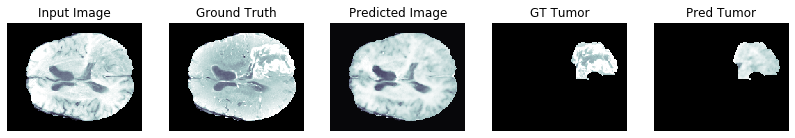

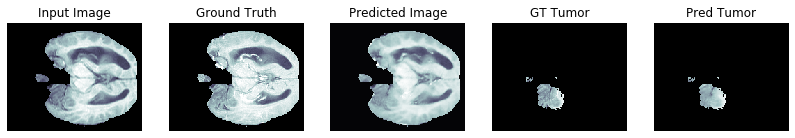

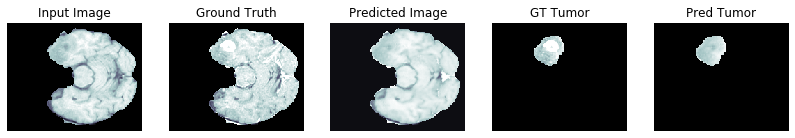

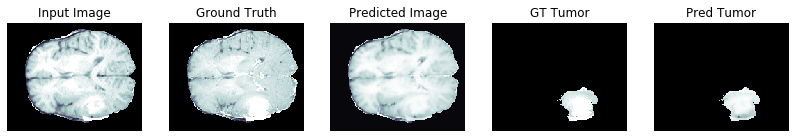

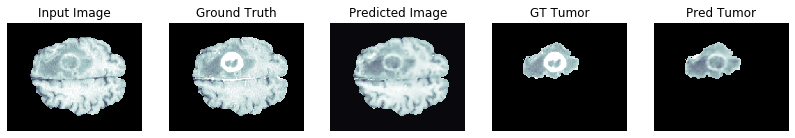

PSNR on validation set: 24.7761 ± 3.7530
MSE on validation set: 0.0044 ± 0.0036
SSIM on validation set: 0.8300 ± 0.0872

PSNR wrt tumor area on validation set: 35.4884 ± 11.6160
MSE wrt tumor area on validation set: 0.0009 ± 0.0011
SSIM wrt tumor area on validation set: 0.9762 ± 0.0230

Generator loss on validation set: 1.9352 ± 0.8198
Discriminator loss on validation set: 1.5845 ± 0.1059


(<tf.Tensor: shape=(), dtype=float32, numpy=24.776085>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.0044276603>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.8300424>,
 <tf.Tensor: shape=(), dtype=float32, numpy=35.488365>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.00091472996>,
 <tf.Tensor: shape=(), dtype=float32, numpy=0.97615814>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.9351636>,
 <tf.Tensor: shape=(), dtype=float32, numpy=1.584452>)

In [0]:
# Let's check the scores of this model.

evaluate_GAN(generator, validation, 'validation', True, True)

In [0]:
generator.save('drive/My Drive/MRI-generation/gen_T1_finalModel.h5')

## Considerations about metrics and normalization

In [0]:
training, validation, testing = load_datasets() # I'll use this in case I get stuck with the cache.

In [0]:
for raw_record in testing.take(1):
    inp, ground_truth = take_images_from_raw(raw_record)

    prediction = generator(inp, training=False)
    inp, ground_truth, prediction = resize_with_crop(inp, ground_truth, prediction)

    prediction_normalized = mean_normalize(prediction)
    ground_truth_normalized = mean_normalize(ground_truth) 

    #prediction_normalized2 = min_max_normalize(prediction)
    
    # remove black images from ground_truth is not that necessary because it's enough to do it on the predictions. 
    # Anyway, just to be sure, let's remove them also from the ground truth (so the metrics of those images will be ignored)

    # BLACK IMAGES ARE DISCARDED IN ALL THE METRICS COMPUTED. Both in the case where I normalize and in the one in which I don't.
    # What if, in the case in which I don't normalize, I keep the black images? We would have significant differences.
    # For example PSNR would be 27.0207 ± 10.2544 instead of  25.2498 ± 2.8603 (with the model trained)
    ground_truth = black_images_to_nan(ground_truth)
    prediction = black_images_to_nan(prediction)

    #mean, std, psnr = compute_psnr(ground_truth, prediction_normalized2)
    #print("PSNR w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth_normalized, prediction_normalized)
    print("PSNR w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, psnr = compute_psnr(ground_truth, prediction)
    print("PSNR: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, ssim = compute_ssim(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth_normalized, prediction_normalized)
    print("SSIM w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, ssim = compute_ssim(ground_truth, prediction)
    print("SSIM: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    print()
    #mean, std, mse = compute_mse(ground_truth, prediction_normalized2)
    #print("SSIM w/ min-max norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth_normalized, prediction_normalized)
    print("MSE w/ mean-norm: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))
    mean, std, mse = compute_mse(ground_truth, prediction)
    print("MSE: {} ± {}".format((f'{mean:.4f}'), (f'{std:.4f}')))

## Additional notes

In [0]:
# in the testing there are 28 patients so 128*28 = 3584 samples
# with a batch_size of 32, we have 112 elements in the prefetched TEST set so 3584 samples.
# in the VALIDATION SET: 108 elements * 32 (batch_size) = 3456 samples.
# in the TRAINING set: 876 elements * 32 = 28032

# each samples has then all the scans defined in the load_dataset (up to 4 scans + the segmented area)
# if batch size is set to 32, then there are less then 100 samples.

# training: with GPU it crashes, with TPU works. a bit more of 28000 samples -> 219 patients * 128 levels.

# training with 100 samples, batch size = 1 and TPU took 46 seconds
# training with 100 samples, batch size = 1 and GPU took 7/8 seconds

# training with 1000 samples, batch size = 1, resizing to 256, GPU took 54 seconds
# training with 1000 samples, batch size = 1, padding to 256, GPU took 52 seconds

# TRAINING TIMES WITH DIFFERENT BATCH SIZES:
# training with 16 samples and batch size = 64 (so 1024 samples fed to the GAN), TPU took 209 seconds

# training with 1000 samples and batch size = 1 (so 1000 samples fed to the GAN), GPU took about 490 seconds (8 min)
# training with 250 samples and bs = 4 (so 1000 samples fed to the GAN), GPU took 127 seconds!
# training with 128 samples and bs = 8 (so 1024 samples fed to the GAN), GPU took 75 seconds!
# training with 64 samples and bs = 16 (so 1024 samples fed to the GAN), GPU took 41 seconds!
# training with 31 samples and bs = 32 (so still 992 samples fed to the GAN), GPU took 28/32/33
# training with 16 samples and bs = 64 (so 1024 samples fed to the GAN), GPU took 23/25/26 seconds!

# training with 8 samples and bs = 128, GPU took 24/25( 21 in the most recent) sec! -> not so good quality
# (It has been observed in practice that when using a larger batch there is a significant degradation in the 
# quality of the model, as measured by its ability to generalize.)
# https://stats.stackexchange.com/questions/164876/tradeoff-batch-size-vs-number-of-iterations-to-train-a-neural-network

# The resulting model may not generalize as well as a model trained with a small batch size

# tradeoff between 32 and 64. 32 seems to be qualitatively more accurate but it's a bit slower. 
# before choosing, it would be better to implement also the quantitative metrics.

# from pix2pix paper: use batch sizes between 1 and 10 depending on the experiment


# In general, batch size of 32 is a good starting point, and you should also try with 64, 128, and 256. 
# Other values (lower or higher) may be fine for some data sets, but the given range is generally the best to 
# start experimenting with. Though, under 32, it might get too slow because of significantly lower computational speed, 
# because of not exploiting vectorization to the full extent.  
# If you get an "out of memory" error, you should try reducing the mini-batch size anyway.


# training with 4 samples and bs = 256, GPU run out of memory. Resource exhausted.

In [0]:
# np.FUNCTION VS tf.FUNCTION

# np =  training with 31 samples and bs = 32 (992 samples fed to the GAN), GPU took 28/32/33
# training with 32 samples and bs = 32 (1024 samples fed to the GAN), GPU took 14/15/16/17 seconds 